# Capstone Project - Stock And Portfolio Management 

**Problem Statement**
 
Analyse different securities and risks associated with those securities. Advise the client on her investment funds so that the client can achieve her financial goals. 

# Contents :

- Data loading
- Data Exploration ( EDA )
- Stock Analysis and Portfolio Management - CAPM
- Conclusion 1
- Stock Price Prediction - Validation of conclusion
- Final Reporting

In [1]:
# Libraries for numerical calculations :

import math
import pandas as pd
import numpy as np

# Libraries for plotting graphs:

import matplotlib.pyplot as plt
import seaborn as sns

# Libraries for ignoring warnings :

import warnings
warnings.filterwarnings('ignore')

# Libraries for Modelling, Checking Error, Kpss-Test and BoxCox Transformation :

import statsmodels.api as sm
from statsmodels.tsa.api import VAR
from sklearn.metrics import mean_squared_error
from scipy.stats import boxcox
from statsmodels.tsa.stattools import kpss

In [2]:
# Fetching the different datasets using different variable names :

# Aviation Stocks :
aal = pd.read_csv("AAL.csv")
alk = pd.read_csv("ALK.csv")
ha = pd.read_csv("HA.csv")

# Finance Stocks :
cs = pd.read_csv("CS.csv")
db = pd.read_csv("DB.csv")
gs = pd.read_csv("GS.csv")

# Health Care Stocks :
jnj = pd.read_csv("JNJ.csv")
mrk = pd.read_csv("MRK.csv")
bhc = pd.read_csv("BHC.csv")

# Tech Stocks :
aapl = pd.read_csv("AAPL.csv")
amzn = pd.read_csv("AMZN.csv")
goog = pd.read_csv("GOOG.csv")

# S and P 500 :
snp = pd.read_csv("S&P500.csv")

In [3]:
# Checking data using S and P file : 

snp.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,1143.489990,1150.300049,1139.420044,1146.239990,1146.239990,4298910000
1,04-10-2010,1144.959961,1148.160034,1131.869995,1137.030029,1137.030029,3604110000
2,05-10-2010,1140.680054,1162.760010,1140.680054,1160.750000,1160.750000,4068840000
3,06-10-2010,1159.810059,1162.329956,1154.849976,1159.969971,1159.969971,4073160000
4,07-10-2010,1161.569946,1163.869995,1151.410034,1158.060059,1158.060059,3910550000


**`We do not require stock open price, stock low and high prices, and adj close prices for our analysis`. So we would not include them while merging columns of different csv files.**

# Merging the files :

In [4]:
# Merging the files:

f1 = aal[["Date","Close","Volume"]].merge(alk[["Date","Close","Volume"]], 
                                     on = "Date", 
                                     how = "left")
  
f1.rename(columns = {'Close_x':'close_aal','Volume_x':'volume_aal'}, inplace = True)
f1.rename(columns = {'Close_y':'close_alk','Volume_y':'volume_alk'}, inplace = True)

f1 = f1.merge(goog[["Date","Close","Volume"]], 
                                     on = "Date", 
                                     how = "left")
  
f1.rename(columns = {'Close':'close_goog','Volume':'volume_goog'}, inplace = True)

f1 = f1.merge(amzn[["Date","Close","Volume"]], 
                                     on = "Date", 
                                     how = "left")
  
f1.rename(columns = {'Close':'close_amzn','Volume':'volume_amzn'}, inplace = True)

f1 = f1.merge(ha[["Date","Close","Volume"]], 
                                     on = "Date", 
                                     how = "left")
  
f1.rename(columns = {'Close':'close_ha','Volume':'volume_ha'}, inplace = True)

f1 = f1.merge(cs[["Date","Close","Volume"]], 
                                     on = "Date", 
                                     how = "left")
  
f1.rename(columns = {'Close':'close_cs','Volume':'volume_cs'}, inplace = True)


f1 = f1.merge(db[["Date","Close","Volume"]], 
                                     on = "Date", 
                                     how = "left")
  
f1.rename(columns = {'Close':'close_db','Volume':'volume_db'}, inplace = True)

f1 = f1.merge(gs[["Date","Close","Volume"]], 
                                     on = "Date", 
                                     how = "left")
  
f1.rename(columns = {'Close':'close_gs','Volume':'volume_gs'}, inplace = True)

f1 = f1.merge(jnj[["Date","Close","Volume"]], 
                                     on = "Date", 
                                     how = "left")
  
f1.rename(columns = {'Close':'close_jnj','Volume':'volume_jnj'}, inplace = True)

f1 = f1.merge(mrk[["Date","Close","Volume"]], 
                                     on = "Date", 
                                     how = "left")
  
f1.rename(columns = {'Close':'close_mrk','Volume':'volume_mrk'}, inplace = True)

f1 = f1.merge(bhc[["Date","Close","Volume"]], 
                                     on = "Date", 
                                     how = "left")
  
f1.rename(columns = {'Close':'close_bhc','Volume':'volume_bhc'}, inplace = True)

f1 = f1.merge(aapl[["Date","Close","Volume"]], 
                                     on = "Date", 
                                     how = "left")

f1.rename(columns = {'Close':'close_aapl','Volume':'volume_aapl'}, inplace = True)

f1 = f1.merge(snp[["Date","Close","Volume"]], 
                                     on = "Date", 
                                     how = "left")
  
f1.rename(columns = {'Close':'close_snp','Volume':'volume_snp'}, inplace = True)

In [5]:
# Let's have a look at our merged file :
f1.head()

# First we will create a copy of the original file:
original = f1.copy()

In [6]:
# Checking the shape of the merged file :

f1.shape

(2517, 27)

**There are a total of `2517 rows and 27 columns` in our merged file.**

In [7]:
# Checking the columns of our merged file :

f1.columns

Index(['Date', 'close_aal', 'volume_aal', 'close_alk', 'volume_alk',
       'close_goog', 'volume_goog', 'close_amzn', 'volume_amzn', 'close_ha',
       'volume_ha', 'close_cs', 'volume_cs', 'close_db', 'volume_db',
       'close_gs', 'volume_gs', 'close_jnj', 'volume_jnj', 'close_mrk',
       'volume_mrk', 'close_bhc', 'volume_bhc', 'close_aapl', 'volume_aapl',
       'close_snp', 'volume_snp'],
      dtype='object')

**We have all the closing prices columns along with the volume of stocks traded column with us and a date column.**

In [8]:
# Describing the dataset:

f1.describe()

,close_aal,volume_aal,close_alk,volume_alk,close_goog,volume_goog,close_amzn,volume_amzn,close_ha,volume_ha,...,close_jnj,volume_jnj,close_mrk,volume_mrk,close_bhc,volume_bhc,close_aapl,volume_aapl,close_snp,volume_snp
count,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,...,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03
mean,29.397636,1.263146e+07,50.031176,1.648085e+06,730.426139,2.951427e+06,854.636107,4.326001e+06,22.870413,9.365502e+05,...,105.277378,8.605432e+06,57.161053,1.193947e+07,61.880687,7.194057e+06,33.454670,2.635459e+08,2111.392732,3.739228e+09
std,15.211889,2.149322e+07,24.187020,1.095121e+06,364.685720,2.460964e+06,745.201139,2.410250e+06,15.483034,6.485618e+05,...,28.174233,4.493037e+06,15.164505,6.218030e+06,57.170002,1.121985e+07,20.630118,2.037493e+08,612.227235,8.805742e+08
min,4.000000,1.158400e+06,11.620000,2.706000e+05,236.553345,7.900000e+03,153.029999,8.813000e+05,3.780000,1.205000e+05,...,57.660000,2.353800e+06,29.809999,2.235900e+06,8.510000,3.803000e+05,9.951428,3.247000e+07,1099.229980,1.025000e+09
25%,13.010000,5.368800e+06,26.780001,1.087600e+06,403.642059,1.393000e+06,266.489990,2.769400e+06,7.030000,5.395000e+05,...,81.930000,5.959500e+06,45.730000,8.222000e+06,22.170000,1.677300e+06,18.961428,1.180676e+08,1562.170044,3.241030e+09
50%,32.520000,7.405700e+06,58.540001,1.399400e+06,651.789978,2.030500e+06,533.750000,3.710900e+06,21.910000,7.699000e+05,...,104.040001,7.737300e+06,57.180000,1.055070e+07,38.759998,3.203800e+06,27.592501,1.935080e+08,2071.219971,3.591270e+09
75%,42.200001,1.078520e+07,67.260002,1.880800e+06,1055.810059,3.966700e+06,1500.000000,5.111000e+06,36.900002,1.133000e+06,...,130.979996,1.002030e+07,64.089996,1.369570e+07,90.269997,7.874000e+06,42.962502,3.505768e+08,2656.300049,4.060610e+09
max,58.470001,4.286171e+08,100.239998,2.734710e+07,1728.280029,2.976060e+07,3531.449951,2.413420e+07,60.299999,1.258690e+07,...,155.509995,9.844020e+07,92.040001,7.429440e+07,262.519989,1.389498e+08,134.179993,1.880998e+09,3580.840088,9.044690e+09


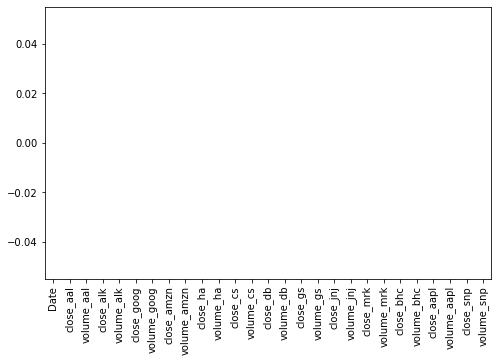

In [9]:
# Checking for null values :

col_null = f1.isnull().sum()
col_null_per = col_null / f1.shape[0]
plt.figure(figsize= (8,5))
col_null_per.plot(kind='bar')

**`Since the bar plot is empty, this implies that there are no missing values in our data. This also means that there is no need for missing value imputation or handling of missing values.`**

In [10]:
# Creating a new excel file:

f1.to_excel("Results.xlsx", index = False)

In [11]:
# Seperating the stock close prices and stock volume traded in two new files:


# Only closing prices columns in a seperate file:

only_close = f1.drop (columns = ['volume_aal','volume_alk','volume_goog','volume_ha','volume_cs','volume_db','volume_gs','volume_jnj','volume_mrk','volume_bhc','volume_aapl','volume_snp','volume_amzn'])


# Only stock traded volume columns in a seperate file:

only_volume = f1.drop (columns = ['close_aal','close_alk','close_goog','close_ha','close_cs','close_db','close_gs','close_jnj','close_mrk','close_bhc','close_aapl','close_snp','close_amzn'])

In [12]:
# Writing a function for plotting line charts :

def show_plot (df,fig_title):
    df.plot (x = 'Date', figsize = (14,7), title = fig_title, linewidth = 2)
    plt.grid()
    plt.show()

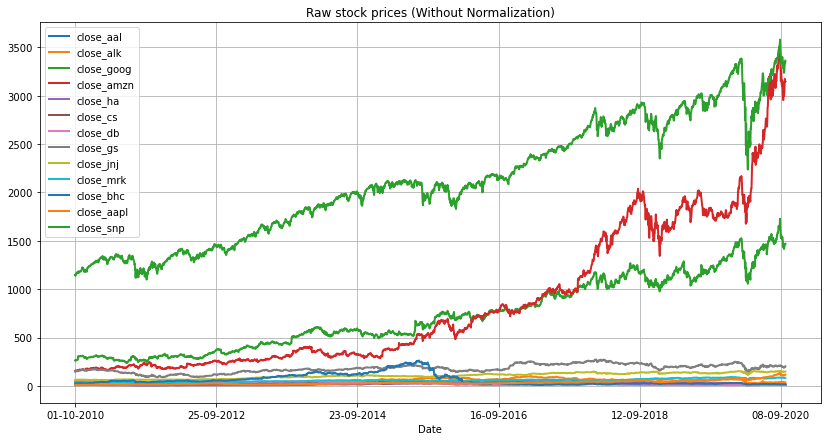

In [13]:
# Plotting a line chart for all given stocks close price without performing normalization: 

show_plot (only_close, 'Raw stock prices (Without Normalization)')

**Without Normalization, it is difficult to provide an observation because different stocks started from different closing prices. In order to make a correct observation we need to do normalization.**

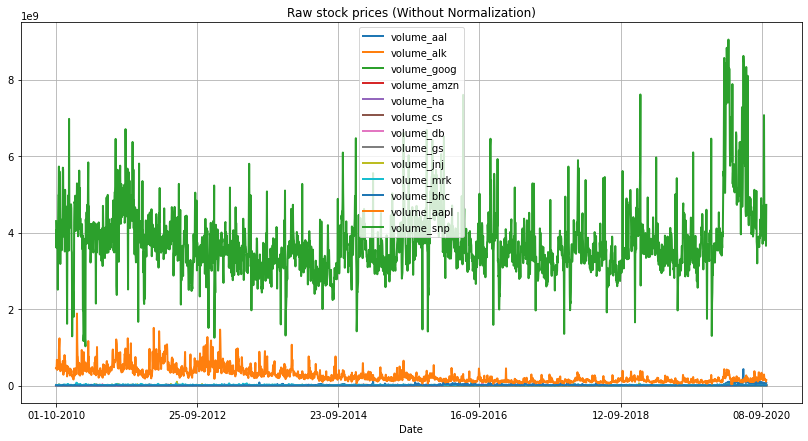

In [14]:
# Plotting a line chart for all given stocks volume without performing normalization: 

show_plot (only_volume, 'Raw stock prices (Without Normalization)')

**As in closing prices, volume graph is very misguiding when observed without normalization.**

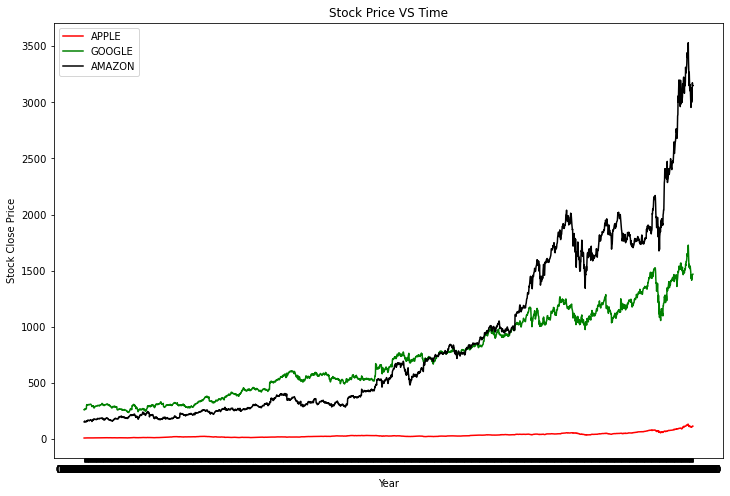

In [15]:
# Let's have a further look on why we need to normalize data ?
#Plotting a line chart for tech stocks ( without normalization):

plt.figure(figsize=(12, 8))

plt.plot( f1.Date, f1.close_aapl,color='red',label='APPLE')
plt.plot(f1.Date, f1.close_goog,color='green',label='GOOGLE')
plt.plot(f1.Date,f1.close_amzn,color='black',label='AMAZON')
plt.legend()

plt.xlabel('Year')
plt.ylabel('Stock Close Price')
plt.title('Stock Price VS Time')
plt.show()

**From the above graph it seems like `Amazon has performed very well in the long run` as it rose exponentially. `Google stock price has also increased significantly` with time. Apple on the other hand has not shown any promising signs.**

**But since this is without normalization so these results can be really misguiding.**

In [16]:
# Seeing APPLE's growth :

# Maximum stock price achieved :
print("Maximum price of Apple stock                :",f1.close_aapl.max())

# Minimum stock price achieved :
print("Minimum price of Apple stock                :",f1.close_aapl.min())

# Stock price on first day :
print("Apple stock price on first day of given data : ",f1.close_aapl[0])

# Stock price on last day :
print("Apple stock price on last day of given data  :",f1.close_aapl[2516])

Maximum price of Apple stock                : 134.179993
Minimum price of Apple stock                : 9.951428
Apple stock price on first day of given data :  10.09
Apple stock price on last day of given data  : 115.809998


**It can be observed that APPLE has grown from a price of 10 dollar to 115 dollars with a minimum value of only 9.95. This implies that `APPLE has also performed well in the long run. However, it has not performed as good as AMAZON and GOOGLE`.**

**`This is why we need to do normalization for fair comparison.`**

# Normalization :

In [17]:
# Create a copy of the original file:

f2=f1.copy()
f2.head()

,Date,close_aal,volume_aal,close_alk,volume_alk,close_goog,volume_goog,close_amzn,volume_amzn,close_ha,...,close_jnj,volume_jnj,close_mrk,volume_mrk,close_bhc,volume_bhc,close_aapl,volume_aapl,close_snp,volume_snp
0,01-10-2010,9.29,3603800,12.4475,1663600.0,261.828613,4466600.0,153.710007,8683400.0,5.96,...,61.750000,9773200.0,36.599998,11741900.0,25.750000,5778700.0,10.090000,448142800,1146.239990,4298910000
1,04-10-2010,9.12,3856800,12.1425,1512400.0,260.199707,3895400.0,155.389999,5346500.0,5.75,...,61.669998,8703600.0,36.520000,9234900.0,25.870001,4187200.0,9.951428,435302000,1137.030029,3604110000
2,05-10-2010,9.23,3896600,12.2150,2567200.0,268.110046,7040400.0,160.869995,5620000.0,5.85,...,62.799999,12439400.0,37.020000,10669200.0,26.299999,4610300.0,10.319285,501967200,1160.750000,4068840000
3,06-10-2010,9.23,3230200,12.1875,1043600.0,266.177307,5545200.0,155.399994,6060800.0,5.97,...,63.209999,11339800.0,37.009998,7541300.0,26.690001,4448900.0,10.328215,670868800,1159.969971,4073160000
4,07-10-2010,9.24,3877700,11.6250,7682400.0,264.015411,4809400.0,156.270004,4622000.0,6.15,...,63.220001,9826600.0,36.709999,13897800.0,26.600000,2453900.0,10.329286,408399600,1158.060059,3910550000


In [18]:
# In order to normalize the data, we will divide every value of the stocks with the very first given value:

# Normalizing the stock close prices :
f2.close_goog = f2.close_goog/f2.close_goog[0]
f2.close_amzn = f2.close_amzn/f2.close_amzn[0]
f2.close_ha = f2.close_ha/f2.close_ha[0]
f2.close_cs = f2.close_cs/f2.close_cs[0]
f2.close_mrk = f2.close_mrk/f2.close_mrk[0]
f2.close_jnj = f2.close_jnj/f2.close_jnj[0]
f2.close_gs = f2.close_gs/f2.close_gs[0]
f2.close_db = f2.close_db/f2.close_db[0]
f2.close_bhc = f2.close_bhc/f2.close_bhc[0]
f2.close_alk = f2.close_alk/f2.close_alk[0]
f2.close_aal = f2.close_aal/f2.close_aal[0]
f2.close_snp = f2.close_snp/f2.close_snp[0]
f2.close_aapl = f2.close_aapl/f2.close_aapl[0]

In [19]:
# Normalizing the stock volume traded :

f2.volume_goog = f2.volume_goog/f2.volume_goog[0]
f2.volume_amzn = f2.volume_amzn/f2.volume_amzn[0]
f2.volume_ha = f2.volume_ha/f2.volume_ha[0]
f2.volume_cs = f2.volume_cs/f2.volume_cs[0]
f2.volume_mrk = f2.volume_mrk/f2.volume_mrk[0]
f2.volume_jnj = f2.volume_jnj/f2.volume_jnj[0]
f2.volume_gs = f2.volume_gs/f2.volume_gs[0]
f2.volume_db = f2.volume_db/f2.volume_db[0]
f2.volume_bhc = f2.volume_bhc/f2.volume_bhc[0]
f2.volume_alk = f2.volume_alk/f2.volume_alk[0]
f2.volume_aal = f2.volume_aal/f2.volume_aal[0]
f2.volume_snp = f2.volume_snp/f2.volume_snp[0]
f2.volume_aapl = f2.volume_aapl/f2.volume_aapl[0]

In [20]:
f2.head()

,Date,close_aal,volume_aal,close_alk,volume_alk,close_goog,volume_goog,close_amzn,volume_amzn,close_ha,...,close_jnj,volume_jnj,close_mrk,volume_mrk,close_bhc,volume_bhc,close_aapl,volume_aapl,close_snp,volume_snp
0,01-10-2010,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,04-10-2010,0.981701,1.070204,0.975497,0.909113,0.993779,0.872117,1.010930,0.615715,0.964765,...,0.998704,0.890558,0.997814,0.786491,1.004660,0.724592,0.986266,0.971347,0.991965,0.838378
2,05-10-2010,0.993541,1.081248,0.981322,1.543159,1.023991,1.576232,1.046581,0.647212,0.981544,...,1.017004,1.272807,1.011475,0.908643,1.021359,0.797809,1.022724,1.120105,1.012659,0.946482
3,06-10-2010,0.993541,0.896332,0.979112,0.627314,1.016609,1.241481,1.010995,0.697975,1.001678,...,1.023644,1.160296,1.011202,0.642256,1.036505,0.769879,1.023609,1.496998,1.011978,0.947487
4,07-10-2010,0.994618,1.076003,0.933922,4.617937,1.008352,1.076747,1.016655,0.532280,1.031879,...,1.023806,1.005464,1.003005,1.183607,1.033010,0.424646,1.023715,0.911316,1.010312,0.909661


**Now we have normalized data in f2. We will use this data to plot graphs and make comparisons.**

In [21]:
# Seperating the tech stocks in a new file:

only_tech = f2.drop (columns = ['close_aal','close_alk','close_ha','close_cs','close_db','close_gs','close_jnj','close_mrk','close_bhc','close_snp','volume_aal','volume_alk','volume_goog','volume_ha','volume_cs','volume_db','volume_gs','volume_jnj','volume_mrk','volume_bhc','volume_aapl','volume_snp','volume_amzn'])
only_tech.head()

,Date,close_goog,close_amzn,close_aapl
0,01-10-2010,1.000000,1.000000,1.000000
1,04-10-2010,0.993779,1.010930,0.986266
2,05-10-2010,1.023991,1.046581,1.022724
3,06-10-2010,1.016609,1.010995,1.023609
4,07-10-2010,1.008352,1.016655,1.023715


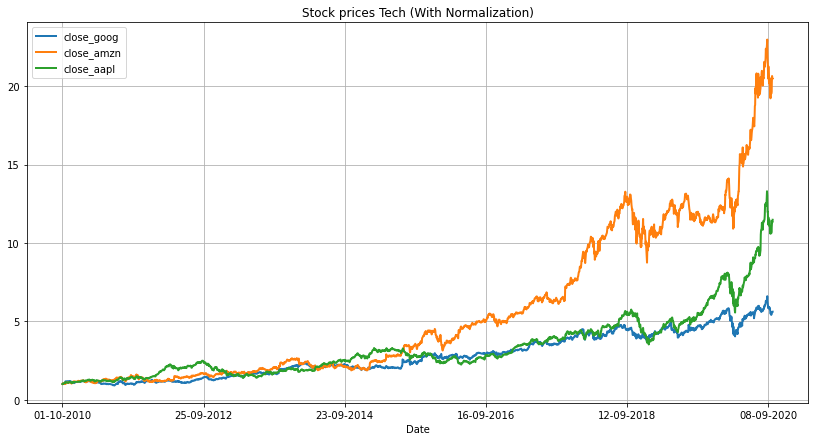

In [22]:
# Plotting a line chart for all tech stocks after normalization: 

show_plot (only_tech, 'Stock prices Tech (With Normalization)')

**OBSERVATIONS :**

    After normalization situation looks very different , as:
    
    - APPLE stock has risen more than GOOGLE in normalized graph. 
    - 1 USD invested in all three of them in the beginning would have become nearly 6 times in GOOGLE , 11 times in APPLE
      and 21 times in AMAZON.
      
**This means that the best returns were given by AMAZON than by APPLE followed by GOOGLE.**

In [23]:
# Seperating the finance stocks in a new file:

only_finance = f2.drop (columns = ['close_aal','close_alk','close_ha','close_amzn','close_aapl','close_goog','close_jnj','close_mrk','close_bhc','close_snp','volume_aal','volume_alk','volume_goog','volume_ha','volume_cs','volume_db','volume_gs','volume_jnj','volume_mrk','volume_bhc','volume_aapl','volume_snp','volume_amzn'])
only_finance.head()

,Date,close_cs,close_db,close_gs
0,01-10-2010,1.000000,1.000000,1.000000
1,04-10-2010,0.992599,0.984035,0.992349
2,05-10-2010,1.021970,1.025762,1.012661
3,06-10-2010,1.028677,1.038280,1.021259
4,07-10-2010,1.034228,1.027395,1.023087


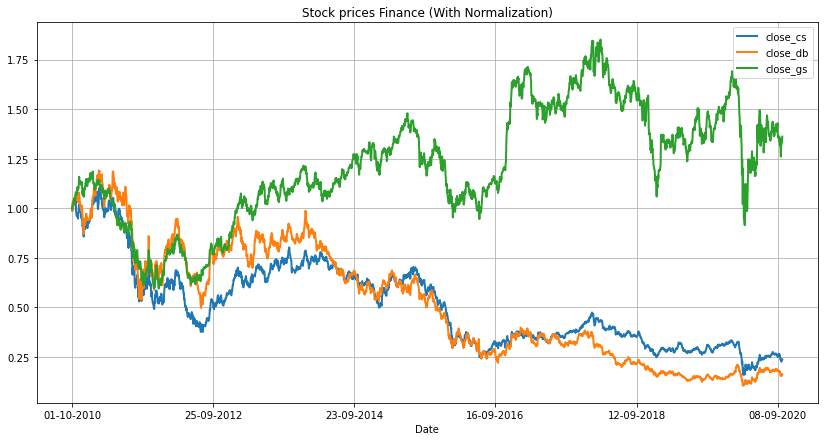

In [24]:
# Plotting a line chart for all Finance stocks after normalization: 

show_plot (only_finance, 'Stock prices Finance (With Normalization)')

**OBSERVATIONS :**

    - Goldman Sachs has risen to about 1.25 of its original value.
    - Credit suisse and Deutsche bank have depreciated in their prices in the given decade to 0.25 of original value.
    
**Out of these three , Credit Suisse and Deutsche Bank shall be rejected.**

In [25]:
# Seperating the health care stocks in a new file:

only_health = f2.drop (columns = ['close_aal','close_alk','close_ha','close_amzn','close_aapl','close_goog','close_db','close_cs','close_gs','close_snp','volume_aal','volume_alk','volume_goog','volume_ha','volume_cs','volume_db','volume_gs','volume_jnj','volume_mrk','volume_bhc','volume_aapl','volume_snp','volume_amzn'])
only_health.head()

,Date,close_jnj,close_mrk,close_bhc
0,01-10-2010,1.000000,1.000000,1.000000
1,04-10-2010,0.998704,0.997814,1.004660
2,05-10-2010,1.017004,1.011475,1.021359
3,06-10-2010,1.023644,1.011202,1.036505
4,07-10-2010,1.023806,1.003005,1.033010


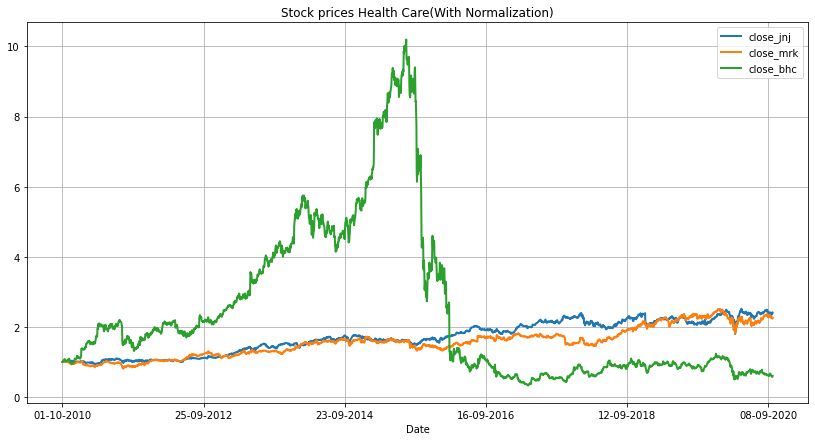

In [26]:
# Plotting a line chart for all Health Care stocks after normalization: 

show_plot (only_health, 'Stock prices Health Care(With Normalization)')

**OBSERVATIONS :**

    - Bausch Health rose to 10 times in the first 5 years but after that it fell drastically and didn't recover 
      back. In  fact it's final stock price seems to be lesser than the beginning price. 
      
    - Both of the other stocks- Johnson & Johnson and Merk & CO. have shown a very similar rise and both of them doubled
      the returns in the time frame given. These two actually look very safe stocks.
    
**This means that out of these three , Bausch Health should be rejected.**

In [27]:
# Seperating the health care stocks in a new file:

only_Aviation = f2.drop (columns = ['close_jnj','close_mrk','close_bhc','close_amzn','close_aapl','close_goog','close_db','close_cs','close_gs','close_snp','volume_aal','volume_alk','volume_goog','volume_ha','volume_cs','volume_db','volume_gs','volume_jnj','volume_mrk','volume_bhc','volume_aapl','volume_snp','volume_amzn'])
only_Aviation.head()

,Date,close_aal,close_alk,close_ha
0,01-10-2010,1.000000,1.000000,1.000000
1,04-10-2010,0.981701,0.975497,0.964765
2,05-10-2010,0.993541,0.981322,0.981544
3,06-10-2010,0.993541,0.979112,1.001678
4,07-10-2010,0.994618,0.933922,1.031879


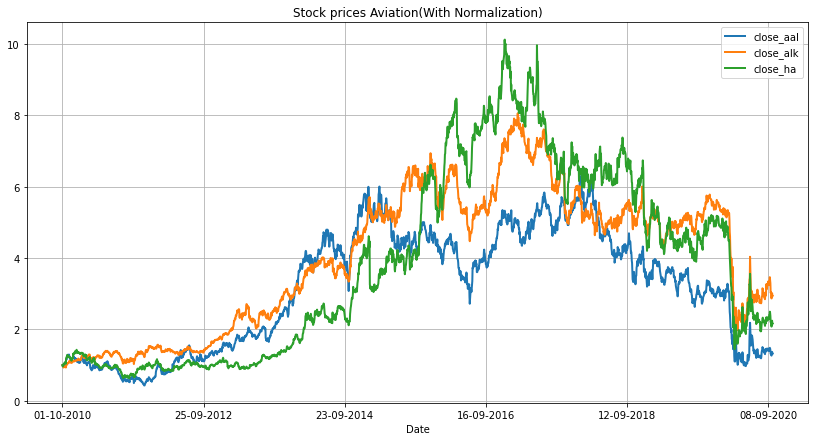

In [28]:
# Plotting a line chart for all Aviation stocks after normalization: 

show_plot (only_Aviation, 'Stock prices Aviation(With Normalization)')

**OBSERVATIONS :**

    - These three stocks look correlated together as they show a very similar price movement. 
    - From this line chart Hawaiian Airlines have grown highest in 10 years compared to others but it ended poorly and
      Alaskan Airlines ended at the top among the three. 

# Tech Stocks:

APPLE

Number of days for which the stock price rose the very next day:   1329
Percentage of days for which price rose the very next day:         52.80095351609059


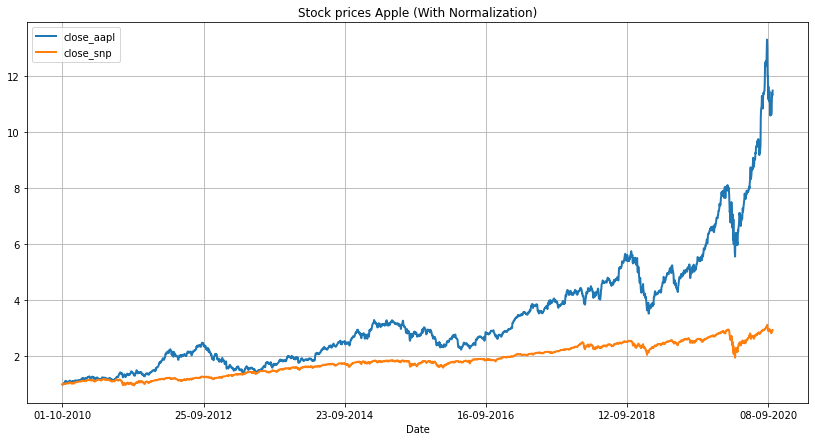

In [29]:
# Apple VS S and P :

apple = f2.drop (columns = ['close_jnj','close_mrk','close_bhc','close_amzn','close_goog','close_db','close_cs','close_gs','close_aal','close_alk','close_ha','volume_aal','volume_alk','volume_goog','volume_ha','volume_cs','volume_db','volume_gs','volume_jnj','volume_mrk','volume_bhc','volume_aapl','volume_snp','volume_amzn'])

t=0
for i in range (0,2516):
    if (f2.close_aapl[i]<f2.close_aapl[i+1]):

    
        t=t+1
print("APPLE\n")
print("Number of days for which the stock price rose the very next day:  ",t)  

# percentage :
per = (t/2517)*100
print("Percentage of days for which price rose the very next day:        ", per)


# Comparison of Apple with S and P index :

show_plot (apple, 'Stock prices Apple (With Normalization)')

**Apple has outlasted the snp in performance for almost the entire decade. This implies it is promising.**

GOOGLE

Number of days for which the stock price rose the very next day:   1330
Percentage of days for which price rose the very next day:         52.840683353198244


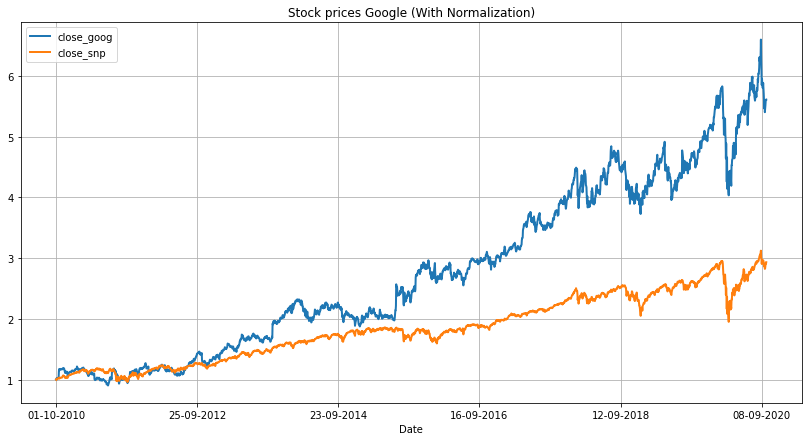

In [30]:
# Google VS S and P :

google = f2.drop (columns = ['close_jnj','close_mrk','close_bhc','close_amzn','close_aapl','close_db','close_cs','close_gs','close_aal','close_alk','close_ha','volume_aal','volume_alk','volume_goog','volume_ha','volume_cs','volume_db','volume_gs','volume_jnj','volume_mrk','volume_bhc','volume_aapl','volume_snp','volume_amzn'])

t=0
for i in range (0,2516):
    if (f2.close_goog[i]<f2.close_goog[i+1]):

    
        t=t+1
print("GOOGLE\n")
print("Number of days for which the stock price rose the very next day:  ",t)  

# percentage :
per = (t/2517)*100
print("Percentage of days for which price rose the very next day:        ", per)


# Comparison of Google with S and P index :

show_plot (google, 'Stock prices Google (With Normalization)')

**Google has outlasted s and p index in it's last 8 years. And overall it has been a good performer.**

AMAZON

Number of days for which the stock price rose the very next day:   1345
Percentage of days for which price rose the very next day:         53.43663090981327


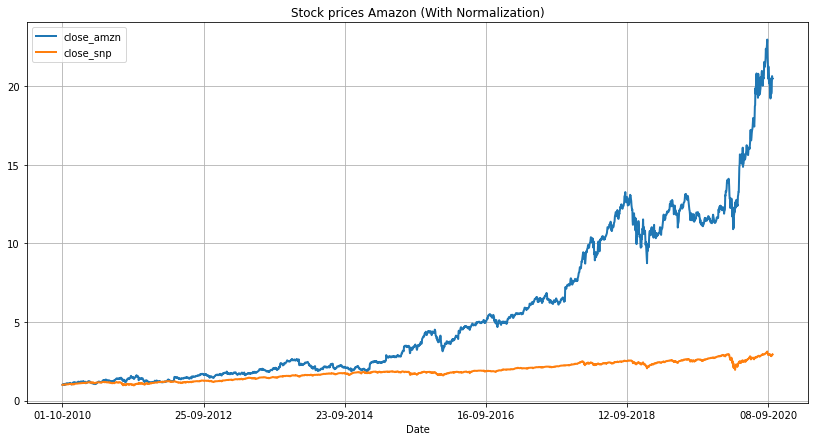

In [31]:
# Amazon VS S and P :

amazon = f2.drop (columns = ['close_jnj','close_mrk','close_bhc','close_aapl','close_goog','close_db','close_cs','close_gs','close_aal','close_alk','close_ha','volume_aal','volume_alk','volume_goog','volume_ha','volume_cs','volume_db','volume_gs','volume_jnj','volume_mrk','volume_bhc','volume_aapl','volume_snp','volume_amzn'])

t=0
for i in range (0,2516):
    if (f2.close_amzn[i]<f2.close_amzn[i+1]):

    
        t=t+1
print("AMAZON\n")
print("Number of days for which the stock price rose the very next day:  ",t)  

# percentage :
per = (t/2517)*100
print("Percentage of days for which price rose the very next day:        ", per)


# Comparison of Apple with S and P index :

show_plot (amazon, 'Stock prices Amazon (With Normalization)')

**We can observe here that Amazon stocks value increased the very next day from it's previous day value for the most number of days ( 53.4% ) in the tech stocks. And if we see the price movement for Amazon, Amazon's price has reached the highest compared to others.**

**`Among Tech stocks AMAZON is best performing. However, all the tech stocks have performed good.`**

# Aviation Industries :

AMERICAN AIRLINES

Number of days for which the stock price rose the very next day:   1261
Percentage of days for which price rose the very next day:         50.099324592769165


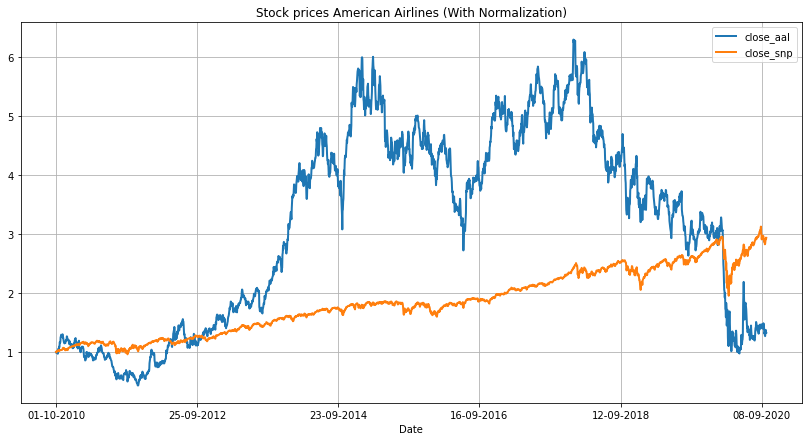

In [32]:
# American Airlines VS S and P :

american = f2.drop (columns = ['close_jnj','close_mrk','close_bhc','close_amzn','close_goog','close_db','close_cs','close_gs','close_aapl','close_alk','close_ha','volume_aal','volume_alk','volume_goog','volume_ha','volume_cs','volume_db','volume_gs','volume_jnj','volume_mrk','volume_bhc','volume_aapl','volume_snp','volume_amzn'])

t=0
for i in range (0,2516):
    if (f2.close_aal[i]<f2.close_aal[i+1]):

    
        t=t+1
print("AMERICAN AIRLINES\n")
print("Number of days for which the stock price rose the very next day:  ",t)  

# percentage :
per = (t/2517)*100
print("Percentage of days for which price rose the very next day:        ", per)


# Comparison of AAL with S and P index :

show_plot (american, 'Stock prices American Airlines (With Normalization)')

**American Airlines has performed better than the s and p index from 2012 to 2019. But before and after that it has performed poorly. This implies that it can be a volatile stock.**

ALASKA AIR GROUP

Number of days for which the stock price rose the very next day:   1301
Percentage of days for which price rose the very next day:         51.688518077075884


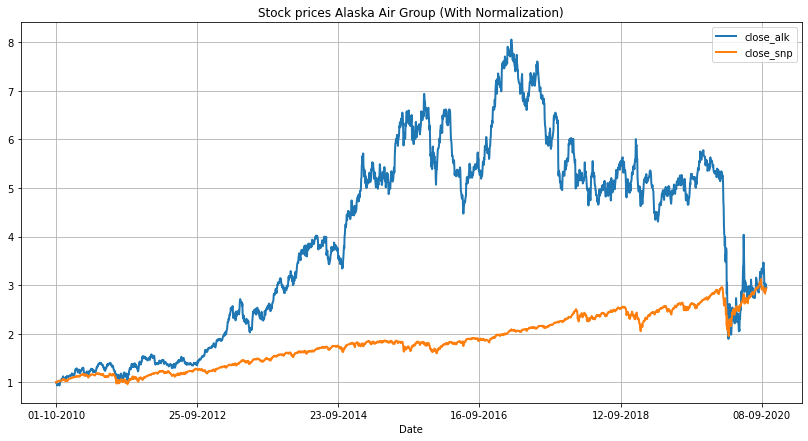

In [33]:
# Alaska Air Group VS S and P :

aag = f2.drop (columns = ['close_jnj','close_mrk','close_bhc','close_amzn','close_goog','close_db','close_cs','close_gs','close_aal','close_aapl','close_ha','volume_aal','volume_alk','volume_goog','volume_ha','volume_cs','volume_db','volume_gs','volume_jnj','volume_mrk','volume_bhc','volume_aapl','volume_snp','volume_amzn'])

t=0
for i in range (0,2516):
    if (f2.close_alk[i]<f2.close_alk[i+1]):

    
        t=t+1
print("ALASKA AIR GROUP\n")
print("Number of days for which the stock price rose the very next day:  ",t)  

# percentage :
per = (t/2517)*100
print("Percentage of days for which price rose the very next day:        ", per)


# Comparison of ALK with S and P index :

show_plot (aag, 'Stock prices Alaska Air Group (With Normalization)')

**Alaska Air performed better than s and p index in first 9 years and after that it is following the s and p index. It has not fallen below s and p mark so it can be considered too.**

HAWAIIAN AIR

Number of days for which the stock price rose the very next day:   1265
Percentage of days for which price rose the very next day:         50.258243941199844


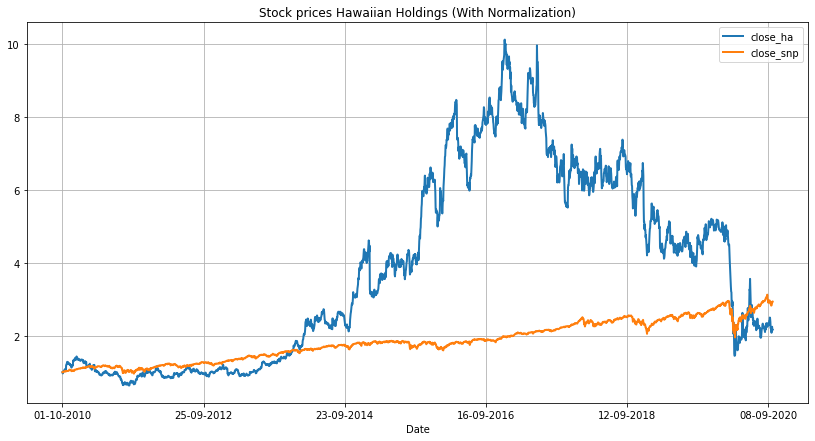

In [34]:
# Hawaiian Holdings VS S and P :

hawai = f2.drop (columns = ['close_jnj','close_mrk','close_bhc','close_amzn','close_goog','close_db','close_cs','close_gs','close_aal','close_alk','close_aapl','volume_aal','volume_alk','volume_goog','volume_ha','volume_cs','volume_db','volume_gs','volume_jnj','volume_mrk','volume_bhc','volume_aapl','volume_snp','volume_amzn'])

t=0
for i in range (0,2516):
    if (f2.close_ha[i]<f2.close_ha[i+1]):

    
        t=t+1
print("HAWAIIAN AIR\n")
print("Number of days for which the stock price rose the very next day:  ",t)  

# percentage :
per = (t/2517)*100
print("Percentage of days for which price rose the very next day:        ", per)


# Comparison of Hawaiian with S and P index :

show_plot (hawai, 'Stock prices Hawaiian Holdings (With Normalization)')

**Observations :**

- Among the aviation industry , Alaska Air Group rose the very next day in its stock price for most number of days ( 51.68% ).
- And Alaska Air stock is the only stock in Aviation which stock price is in-line with S&P 500, whereas other Aviation stocks have underperformed compared to S&P 500.

# Health Care :

BAUSCH HEALTH COMPANIES

Number of days for which the stock price rose the very next day:   1270
Percentage of days for which price rose the very next day:         50.45689312673818


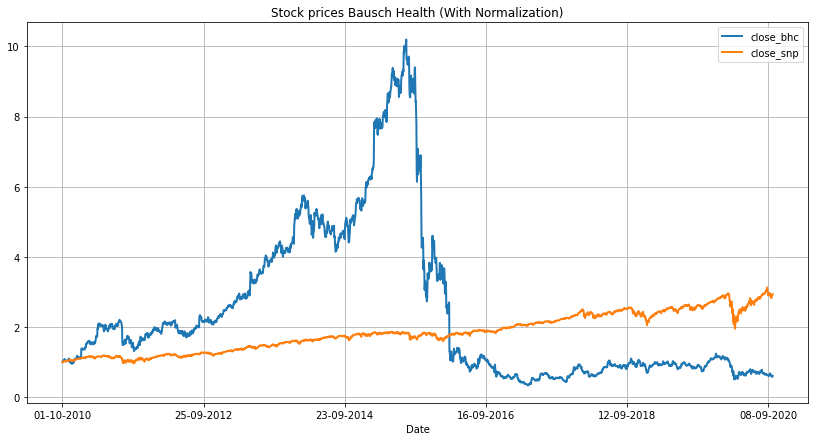

In [35]:
# BHC VS S and P :

bhc = f2.drop (columns = ['close_jnj','close_mrk','close_aapl','close_amzn','close_goog','close_db','close_cs','close_gs','close_aal','close_alk','close_ha','volume_aal','volume_alk','volume_goog','volume_ha','volume_cs','volume_db','volume_gs','volume_jnj','volume_mrk','volume_bhc','volume_aapl','volume_snp','volume_amzn'])

t=0
for i in range (0,2516):
    if (f2.close_bhc[i]<f2.close_bhc[i+1]):

    
        t=t+1
print("BAUSCH HEALTH COMPANIES\n")
print("Number of days for which the stock price rose the very next day:  ",t)  

# percentage :
per = (t/2517)*100
print("Percentage of days for which price rose the very next day:        ", per)


# Comparison of BHC with S and P index :

show_plot (bhc, 'Stock prices Bausch Health (With Normalization)')

**Bausch Health Company has fallen below s and p index in it's last years. This is a poor stock.**

JNJ

Number of days for which the stock price rose the very next day:   1300
Percentage of days for which price rose the very next day:         51.64878823996821


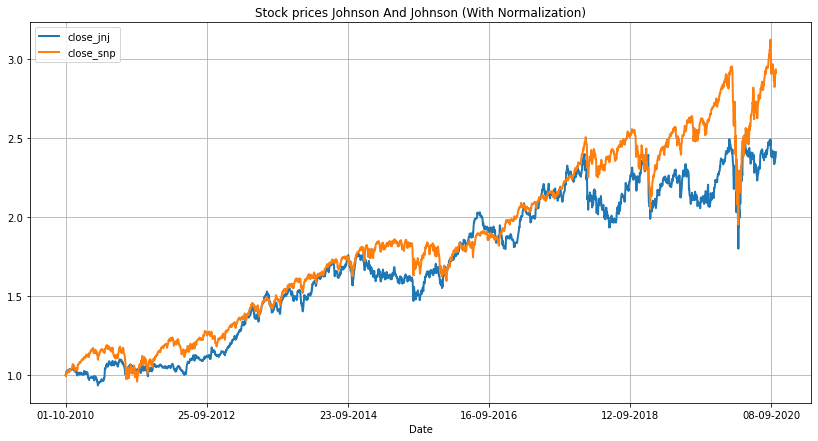

In [36]:
# JNJ VS S and P :

jnj = f2.drop (columns = ['close_aapl','close_mrk','close_bhc','close_amzn','close_goog','close_db','close_cs','close_gs','close_aal','close_alk','close_ha','volume_aal','volume_alk','volume_goog','volume_ha','volume_cs','volume_db','volume_gs','volume_jnj','volume_mrk','volume_bhc','volume_aapl','volume_snp','volume_amzn'])

t=0
for i in range (0,2516):
    if (f2.close_jnj[i]<f2.close_jnj[i+1]):

    
        t=t+1
print("JNJ\n")
print("Number of days for which the stock price rose the very next day:  ",t)  

# percentage :
per = (t/2517)*100
print("Percentage of days for which price rose the very next day:        ", per)


# Comparison of JNJ with S and P index :

show_plot (jnj, 'Stock prices Johnson And Johnson (With Normalization)')

**johnson and johnson is almost in accordance to the s and p index for the decade. Also, it is rising as whole.**

MRK

Number of days for which the stock price rose the very next day:   1278
Percentage of days for which price rose the very next day:         50.77473182359953


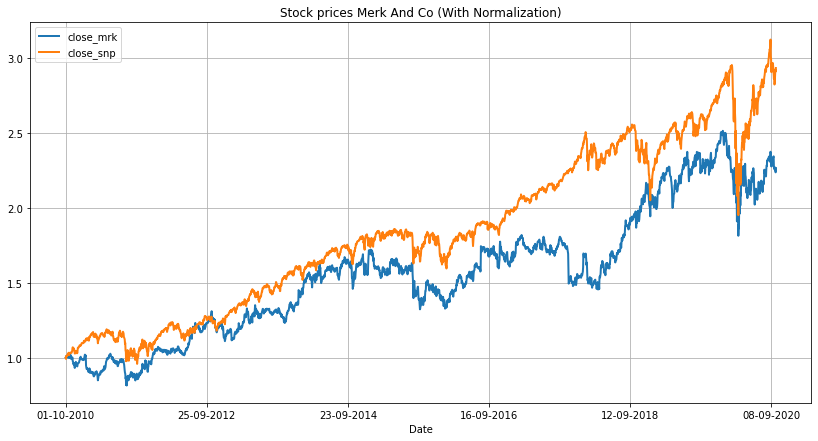

In [37]:
# MRK VS S and P :

mrk = f2.drop (columns = ['close_jnj','close_aapl','close_bhc','close_amzn','close_goog','close_db','close_cs','close_gs','close_aal','close_alk','close_ha','volume_aal','volume_alk','volume_goog','volume_ha','volume_cs','volume_db','volume_gs','volume_jnj','volume_mrk','volume_bhc','volume_aapl','volume_snp','volume_amzn'])

t=0
for i in range (0,2516):
    if (f2.close_mrk[i]<f2.close_mrk[i+1]):

    
        t=t+1
print("MRK\n")
print("Number of days for which the stock price rose the very next day:  ",t)  

# percentage :
per = (t/2517)*100
print("Percentage of days for which price rose the very next day:        ", per)


# Comparison of MRK with S and P index :

show_plot (mrk, 'Stock prices Merk And Co (With Normalization)')

**Observations:**

- Among the healthcare industry , stock price for Johnson and Johnson has increased the most when compared with the very next day ( 51.64% ). And stock price movement of MRK and J&J are in-line with S&P500.
- But the performance of BAUSCH HEALTH is very poor where the price initially increases and later it drops below s and p, and current price is even lower than the price it begin with.

# Finance Stocks :

DB

Number of days for which the stock price rose the very next day:   1218
Percentage of days for which price rose the very next day:         48.39094159713945


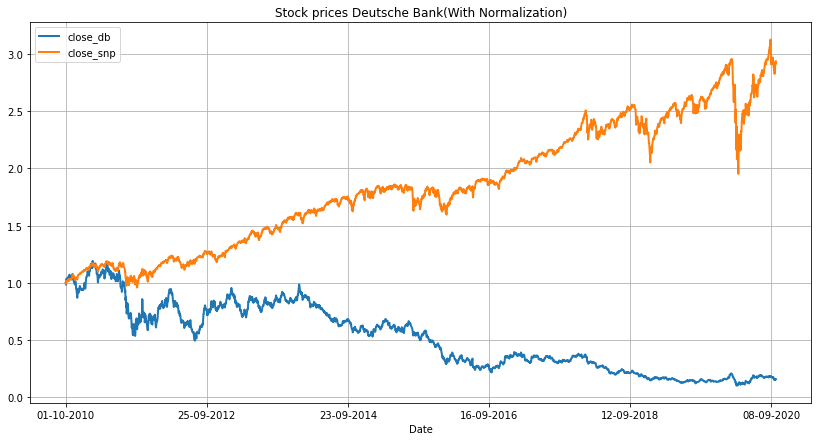

In [38]:
# DB VS S and P :

db = f2.drop (columns = ['close_jnj','close_mrk','close_bhc','close_amzn','close_goog','close_aapl','close_cs','close_gs','close_aal','close_alk','close_ha','volume_aal','volume_alk','volume_goog','volume_ha','volume_cs','volume_db','volume_gs','volume_jnj','volume_mrk','volume_bhc','volume_aapl','volume_snp','volume_amzn'])

t=0
for i in range (0,2516):
    if (f2.close_db[i]<f2.close_db[i+1]):

    
        t=t+1
print("DB\n")
print("Number of days for which the stock price rose the very next day:  ",t)  

# percentage :
per = (t/2517)*100
print("Percentage of days for which price rose the very next day:        ", per)


# Comparison of DB with S and P index :

show_plot (db, 'Stock prices Deutsche Bank(With Normalization)')

**Deutsche Bank has performed very poorly and shall be rejected. It has fallen the most in comparison to s and p index.**

Credit Suisse

Number of days for which the stock price rose the very next day:   1214
Percentage of days for which price rose the very next day:         48.23202224870878


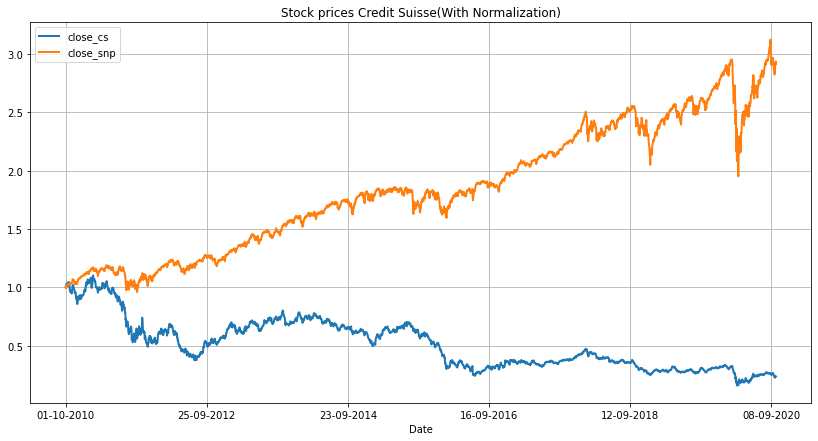

In [39]:
# Credit Suisse VS S and P :

cs = f2.drop (columns = ['close_jnj','close_mrk','close_bhc','close_amzn','close_goog','close_db','close_aapl','close_gs','close_aal','close_alk','close_ha','volume_aal','volume_alk','volume_goog','volume_ha','volume_cs','volume_db','volume_gs','volume_jnj','volume_mrk','volume_bhc','volume_aapl','volume_snp','volume_amzn'])

t=0
for i in range (0,2516):
    if (f2.close_cs[i]<f2.close_cs[i+1]):

    
        t=t+1
print("Credit Suisse\n")
print("Number of days for which the stock price rose the very next day:  ",t)  

# percentage :
per = (t/2517)*100
print("Percentage of days for which price rose the very next day:        ", per)


# Comparison of CS with S and P index :

show_plot (cs, 'Stock prices Credit Suisse(With Normalization)')

**Credit Suisse has fallen very badly and shall not be a priority. It is an underperforming stock.**

GOLDMAN SACHS

Number of days for which the stock price rose the very next day:   1296
Percentage of days for which price rose the very next day:         51.48986889153755


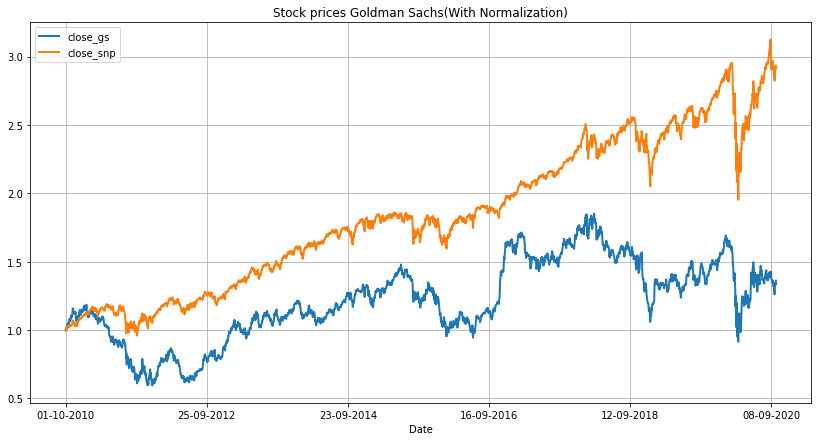

In [40]:
# Goldman Sachs VS S and P :

gs = f2.drop (columns = ['close_jnj','close_mrk','close_bhc','close_amzn','close_goog','close_db','close_cs','close_aapl','close_aal','close_alk','close_ha','volume_aal','volume_alk','volume_goog','volume_ha','volume_cs','volume_db','volume_gs','volume_jnj','volume_mrk','volume_bhc','volume_aapl','volume_snp','volume_amzn'])

t=0
for i in range (0,2516):
    if (f2.close_gs[i]<f2.close_gs[i+1]):

    
        t=t+1
print("GOLDMAN SACHS\n")
print("Number of days for which the stock price rose the very next day:  ",t)  

# percentage :
per = (t/2517)*100
print("Percentage of days for which price rose the very next day:        ", per)


# Comparison of GS with S and P index :

show_plot (gs, 'Stock prices Goldman Sachs(With Normalization)')

**Among the Finance Industry , stock price for Goldman Sachs rose the most number of days from its previous day price. Apart from GOLDMAN SACHS both the other finance stocks have underperformed and are lower in price than the original price.**

# Observations untill now :

**Among the four industries , the best performing stocks untill now are the following :-**

    -Goldman Sachs in Finance Industry.

    -Johnson and Johnson in Healthcare Industry.

    -Alaska Air Group in Aviation Industry.

    -Amazon in Tech Industry.
    
**Overall top 5 stocks which rose the most in price the very next day are :**
    - Amazon 
    - Apple
    - Google
    - Alaskan Airlines 
    - Johnson and Johnson

# `Daily return in stock market ( a measure of volatility )`: 

**Intraday return and overnight return together constitute the total daily return from a stock, which is based on the price change of a stock from the close of one trading day to the close of the next trading day.**

**This is given by the difference of the next day closing price and todays closing price of the stock.**

# Volatility:

In [41]:
df = f1['close_snp']
df

0       1146.239990
1       1137.030029
2       1160.750000
3       1159.969971
4       1158.060059
           ...     
2512    3246.590088
2513    3298.459961
2514    3351.600098
2515    3335.469971
2516    3363.000000
Name: close_snp, Length: 2517, dtype: float64

In [42]:
# Calculating the percentage value of volatility for s and p :

df_daily_return = df.copy()

for j in range (1,len(df)):
    df_daily_return [j] = ((df[j]-df[j-1]) / df[j-1] )* 100
    
df_daily_return [0] = 0
df_daily_return

0       0.000000
1      -0.803493
2       2.086134
3      -0.067200
4      -0.164652
          ...   
2512    0.298746
2513    1.597672
2514    1.611059
2515   -0.481266
2516    0.825372
Name: close_snp, Length: 2517, dtype: float64

In [43]:
# Calculating the percentage value of volatility for stocks :

def daily_return (df):
    df_daily_retun = df.copy()
    
    
    for i in df.columns[1:]:
        
        for j in range (1,len(df)):
            df_daily_retun[i][j] = ((df[i][j] - df[i][j-1]) / df[i][j-1]) * 100
            
            
        df_daily_retun[i][0] = 0
        
    return df_daily_retun

In [44]:
stock_daily_return = daily_return (only_close)
stock_daily_return

,Date,close_aal,close_alk,close_goog,close_amzn,close_ha,close_cs,close_db,close_gs,close_jnj,close_mrk,close_bhc,close_aapl,close_snp
0,01-10-2010,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,04-10-2010,-1.829925,-2.450291,-0.622127,1.092962,-3.523490,-0.740055,-1.596517,-0.765058,-0.129558,-0.218574,0.466023,-1.373360,-0.803493
2,05-10-2010,1.206140,0.597076,3.040103,3.526608,1.739130,2.958993,4.240412,2.046803,1.832335,1.369113,1.662149,3.696525,2.086134
3,06-10-2010,0.000000,-0.225133,-0.720875,-3.400262,2.051282,0.656257,1.220377,0.849093,0.652866,-0.027018,1.482897,0.086537,-0.067200
4,07-10-2010,0.108342,-4.615385,-0.812201,0.559852,3.015075,0.539568,-1.048405,0.179001,0.015823,-0.810589,-0.337209,0.010370,-0.164652
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2512,24-09-2020,-1.341157,-3.147043,0.924250,0.664362,-3.200625,-0.619835,0.745342,4.830220,0.159233,0.629317,-3.303685,1.026884,0.298746
2513,25-09-2020,4.418012,2.801120,1.167124,2.494870,3.225806,-1.455301,-1.356350,-0.082007,0.684320,-0.264584,0.525624,3.751615,1.597672
2514,28-09-2020,3.824247,2.288828,1.353675,2.549818,4.531250,4.430380,5.375000,2.113368,0.995467,-0.204990,-0.196078,2.386890,1.611059
2515,29-09-2020,-3.996865,-2.317536,0.328431,-0.919020,-3.886398,-0.707071,-1.897983,-1.145333,-0.033990,-1.039149,-2.554028,-0.756788,-0.481266


**Stock Daily Return shows the time when stocks have given a positive or a negative return in one day, it will help us to understand the volatility of the stock. The stock with maximum change from it's todays price is the most volatile stock.**

# Stock Daily return Sector wise:

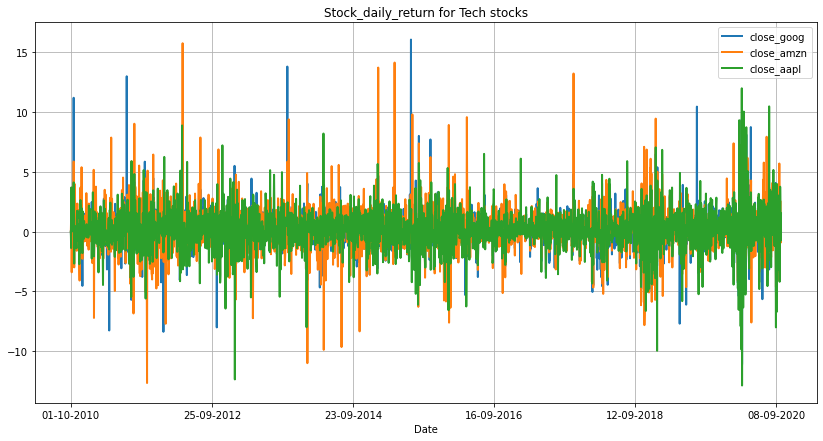

In [45]:
# Tech Stocks :

only_tech1 = stock_daily_return.drop (columns = ['close_aal','close_alk','close_ha','close_cs','close_db','close_gs','close_jnj','close_mrk','close_bhc','close_snp'])
show_plot (only_tech1 , "Stock_daily_return for Tech stocks")

**Observations:**

- All the three stocks have given positive and negative Daily stock returns. In which we can observe that Amazon and Apple are the one which have gave highest negative return . Meaning that Amazon and Apple are the most volatile stocks.
- Google and Amazon has given maximum positive daily stock return.
- `We can consider Google as a less volatile stock compared to others.`

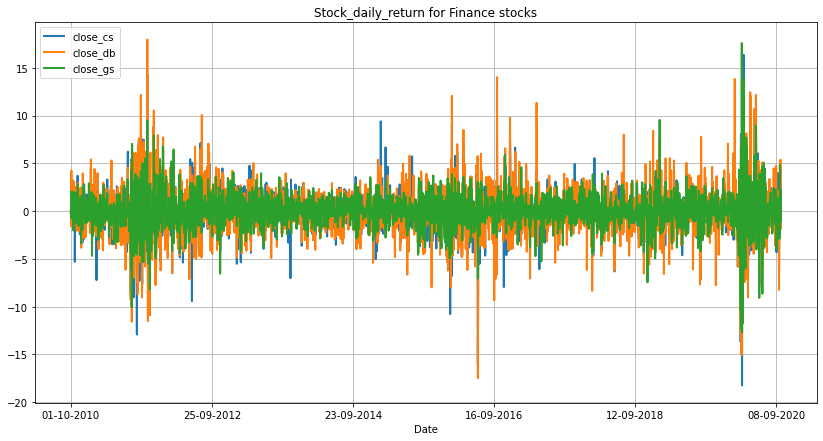

In [46]:
# Finance stocks :

only_finance1 = stock_daily_return.drop (columns = ['close_aal','close_alk','close_ha','close_amzn','close_aapl','close_goog','close_jnj','close_mrk','close_bhc','close_snp'])
show_plot (only_finance1 , "Stock_daily_return for Finance stocks")

**Observations:**

- All the three stocks have given positive as well as negative daily return. Where Deutsche Bank and Credit Suisse have given the highest negative daily stock return.
- Deutsche Bank and Goldman Sachs have given maximum postive daily returns.
- `And Goldman Sachs is a better fund with the least volatility among these three stocks.`

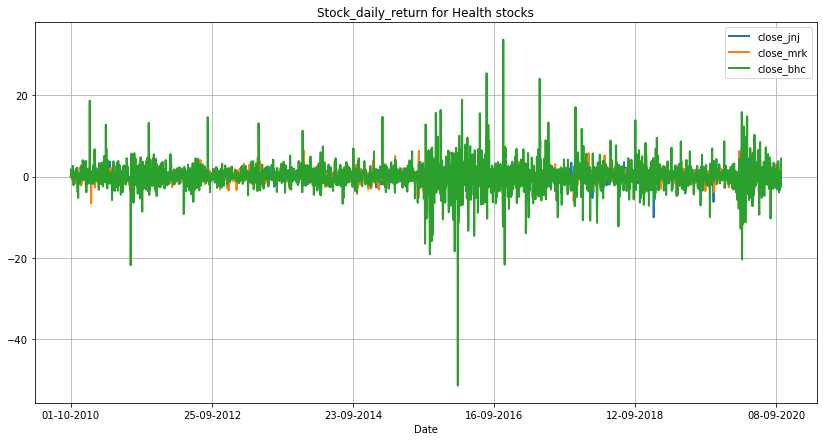

In [47]:
# Health STocks :

only_health1 = stock_daily_return.drop (columns = ['close_aal','close_alk','close_ha','close_amzn','close_aapl','close_goog','close_db','close_cs','close_gs','close_snp'])
show_plot (only_health1 , "Stock_daily_return for Health stocks")

**Observations:**

- It is evident that Bausch Health Company is highly volatile compared to other two stocks.
- We can consider `Merck CO inc. and Johnson & Johnson for investing as they show a lesser volatility.`

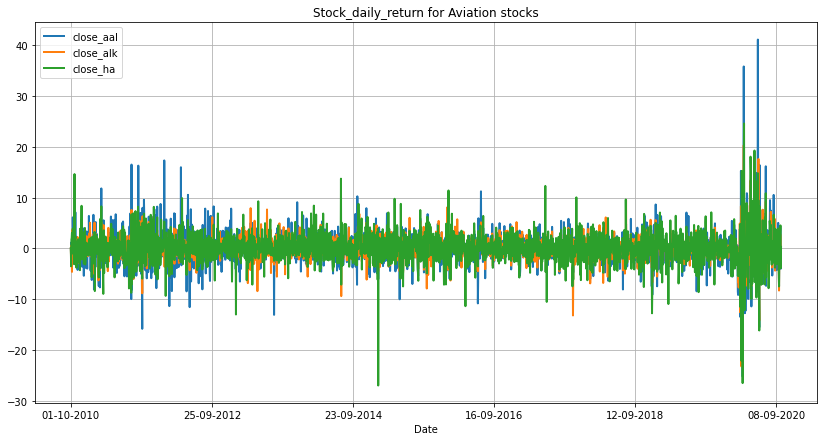

In [48]:
# Aviation Stocks :

only_Aviation1 = stock_daily_return.drop (columns = ['close_jnj','close_mrk','close_bhc','close_amzn','close_aapl','close_goog','close_db','close_cs','close_gs','close_snp'])
show_plot (only_Aviation1 , "Stock_daily_return for Aviation stocks")

**Observations:**

- Hawaiian Holdings Inc and American Airlines Group Inc are more volatile as both have generated high positive and negative daily return. Hawaiian Holdings Inc has the highest negative daily stock return.
- American Airlines has the highest positive daily return.
- ALaskan Airlines seems to be least volatile among three.

# Correlation Matrix:

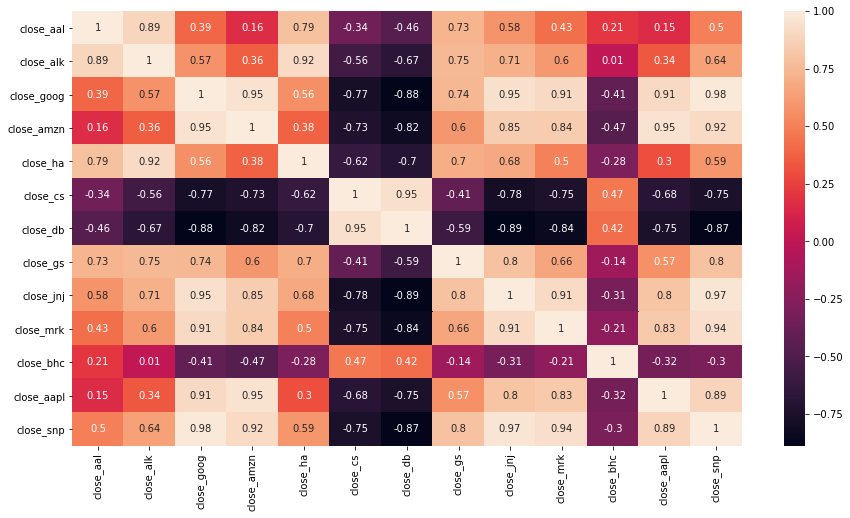

In [49]:
cm = only_close.drop (columns = ['Date']).corr()
plt.figure (figsize = (15,8))
sns.heatmap (cm,annot = True)

**Observations:**
    
   - All three aviation stocks are highly positively correlated among themselves ( with values 0.89,0.79,0.92).
   - Banking stocks are negatively correlated with other domain stocks. Although Goldman Sachs follows a reverse pattern. It is       negatively correlated with banking stocks.
   - Tech stocks are highly positively correlated with themselves.
    

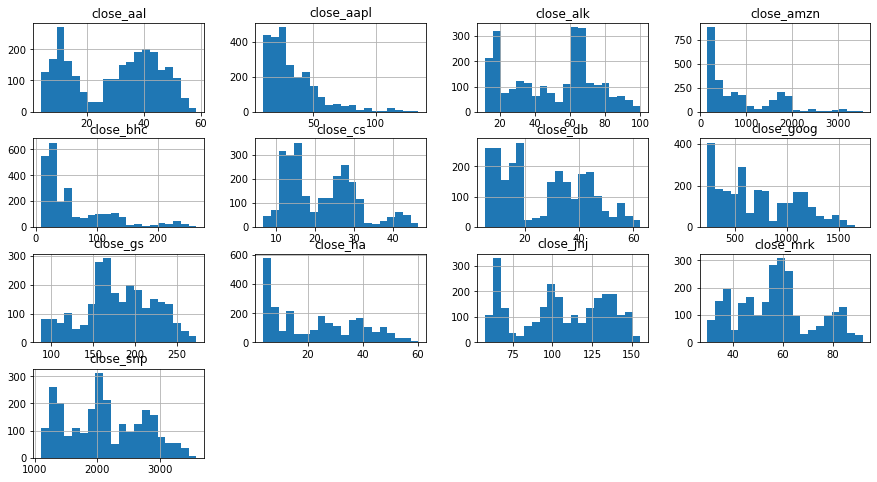

In [50]:
# Histogram :

only_close.hist(figsize =(15,8),bins = 20);

In [51]:
df_hist = only_close.copy()
df_hist = df_hist.drop(columns = ['Date']) 

data = []

for i in df_hist.columns:
    data.append (only_close[i].values)
    
data

[array([ 9.29,  9.12,  9.23, ..., 12.76, 12.25, 12.29]),
 array([12.4475  , 12.1425  , 12.215   , ..., 37.540001, 36.669998,
        36.630001]),
 array([ 261.828613,  260.199707,  268.110046, ..., 1464.52002 ,
        1469.329956, 1469.599976]),
 array([ 153.710007,  155.389999,  160.869995, ..., 3174.050049,
        3144.879883, 3148.72998 ]),
 array([ 5.96,  5.75,  5.85, ..., 13.38, 12.86, 12.89]),
 array([42.226563, 41.914063, 43.154297, ...,  9.9     ,  9.83    ,
         9.97    ]),
 array([52.595421, 51.755726, 53.950382, ...,  8.43    ,  8.27    ,
         8.4     ]),
 array([147.699997, 146.570007, 149.570007, ..., 199.070007, 196.789993,
        200.970001]),
 array([ 61.75    ,  61.669998,  62.799999, ..., 147.110001, 147.059998,
        148.880005]),
 array([36.599998, 36.52    , 37.02    , ..., 82.760002, 81.900002,
        82.949997]),
 array([25.75    , 25.870001, 26.299999, ..., 15.27    , 14.88    ,
        15.54    ]),
 array([ 10.09    ,   9.951428,  10.319285, ..., 

In [52]:
stock_daily_return.mean()

close_aal     0.063661
close_alk     0.070921
close_goog    0.081723
close_amzn    0.139707
close_ha      0.076487
close_cs     -0.032483
close_db     -0.038121
close_gs      0.029041
close_jnj     0.040860
close_mrk     0.041010
close_bhc     0.046399
close_aapl    0.112719
close_snp     0.048777
dtype: float64

**Amazon has the highest daily return value of about 0.14% followed by apple with 0.11%.**
**In different fields, different good returning stocks are:**
   - Hawaiian Airlines ( 0.76% ) in Aviation.
   - Amazon ( 0.13% ) in Tech.
   - Goldman Sachs in Finance ( 0.02% ).
   - Bausch Health ( 0.046% ) in health.
    
**Top 5 good daily return stocks are:**
   - Amazon
   - Apple 
   - Google 
   - Hawaiian Airlines
   - Alaskan Airlines 
   
**Negative performing stocks are :**
   - Credit Suisse
   - Deutsche Bank

# Capital Asset Pricing Model ( CAPM )

**Capital Asset Pricing Model**

To understand the Capital Asset Pricing Model (CAPM),

The formula for calculating the expected return of an asset given its risk is as follows:

ERi = Rf + βi ( ERm − Rf )

where:

ERi = expected return of investment

Rf = risk-free rate

βi = beta of the investment

ERm−Rf = market risk premium

In [53]:
stock_daily_return['close_snp']

0       0.000000
1      -0.803493
2       2.086134
3      -0.067200
4      -0.164652
          ...   
2512    0.298746
2513    1.597672
2514    1.611059
2515   -0.481266
2516    0.825372
Name: close_snp, Length: 2517, dtype: float64

# BETA FOR ALL STOCKS:

In [54]:
# Fit a polynomial between the selected stock and the S&P500 (Poly with order = 1 is a straight line)

# beta represents the slope of the line regression line (market return vs. stock return). 
# Beta is a measure of the volatility or systematic risk of a security or portfolio compared to the entire market (S&P500) 
# Beta is used in the CAPM and describes the relationship between systematic risk and expected return for assets 

# Beta = 1.0, this indicates that its price activity is strongly correlated with the market. 
# Beta < 1, indicates that the security is theoretically less volatile than the market (Ex: Utility stocks). If the stock is included, this will make the portfolio less risky compared to the same portfolio without the stock.
# Beta > 1, indicates that the security's price is more volatile than the market. For instance, Tesla stock beta is 1.26 indicating that it's 26% more volatile than the market. 
# Tech stocks generally have higher betas than S&P500 but they also have excess returns


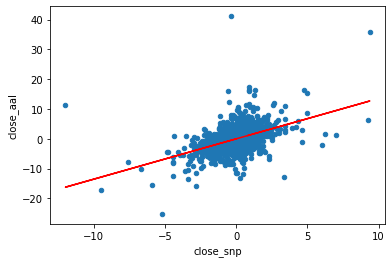

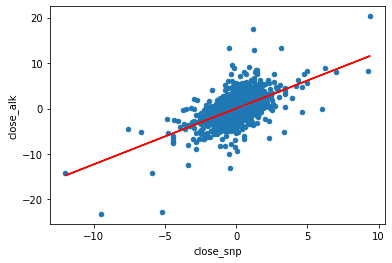

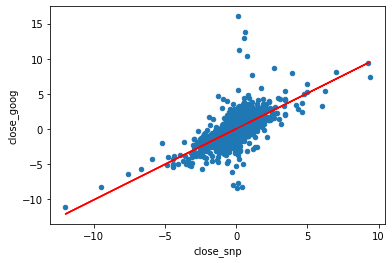

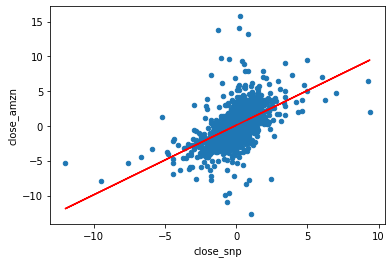

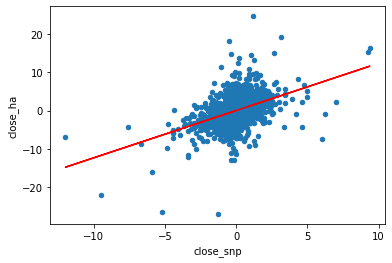

...

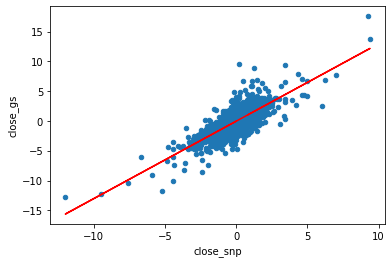

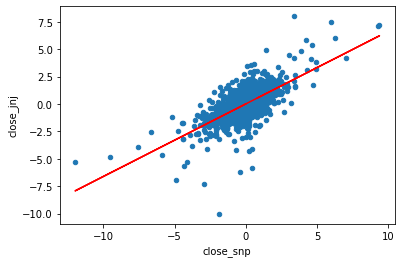

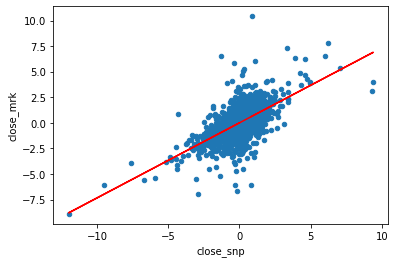

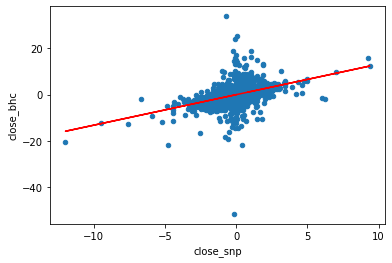

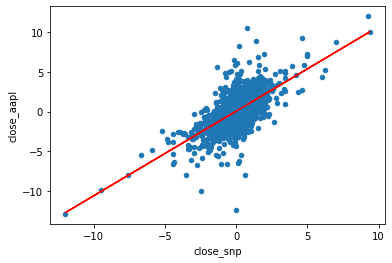

In [55]:
beta = {}
alpha = {}
for i in stock_daily_return.columns:
    if i != 'Date' and i != 'close_snp':
        
        stock_daily_return.plot (kind = 'scatter', x = 'close_snp', y = i )
        b,a = np.polyfit(stock_daily_return['close_snp'] , stock_daily_return [i] , 1)
        plt.plot (stock_daily_return['close_snp'], b * stock_daily_return['close_snp'] + a , '-' , color = 'red')
        
        beta[i] = b
        alpha[i] = a
        
        plt.show()

In [56]:
# Lets view beta for each stock:
beta

{'close_aal': 1.3536094251202482,
 'close_alk': 1.2315117659947994,
 'close_goog': 1.013338554470352,
 'close_amzn': 0.9988037994741072,
 'close_ha': 1.2335342073980324,
 'close_cs': 1.3700003406562395,
 'close_db': 1.5375442070321923,
 'close_gs': 1.3012850996440897,
 'close_jnj': 0.662233123245481,
 'close_mrk': 0.733475572042117,
 'close_bhc': 1.3159707499732256,
 'close_aapl': 1.0633500659817674}

In [57]:
# Let's view alpha for every stock :
alpha

{'close_aal': -0.002363730615303016,
 'close_alk': 0.010851876105067913,
 'close_goog': 0.032295586536582606,
 'close_amzn': 0.09098857805438283,
 'close_ha': 0.01631958990663109,
 'close_cs': -0.09930649553518536,
 'close_db': -0.1131169505285742,
 'close_gs': -0.03443132107850934,
 'close_jnj': 0.008558768984147489,
 'close_mrk': 0.005233141603390076,
 'close_bhc': -0.01778911140940385,
 'close_aapl': 0.060852008506084326}

In [58]:
import plotly.express as px

# Using the plotly express we will now plot for s&p500 vs every stock.
## Plot will be for the best fit straight line for alpha and beta values.

In [59]:
for i in stock_daily_return.columns:
    if i != 'Date' and i != 'close_snp':
        
        fig = px.scatter (stock_daily_return,x = 'close_snp', y = i , title = i)
        b,a = np.polyfit(stock_daily_return['close_snp'], stock_daily_return[i], 1)
        fig.add_scatter (x = stock_daily_return['close_snp'] , y = b * stock_daily_return['close_snp'] + a)
        fig.show()

In [60]:
# Obtain a list of all stock names :

keys = list(beta.keys())
keys

['close_aal',
 'close_alk',
 'close_goog',
 'close_amzn',
 'close_ha',
 'close_cs',
 'close_db',
 'close_gs',
 'close_jnj',
 'close_mrk',
 'close_bhc',
 'close_aapl']

In [61]:
# Define the expected return dictionary :
ER = {}

rf = 0.75
rm = round(stock_daily_return['close_snp'].mean() * 252,3) # this is the expected return of the market 
rm

12.292

**`Expected return of the market is 12.29% `.We will use this to compare other stocks.**

In [62]:
for i in keys:
  # Calculate return for every security using CAPM  
  ER[i] = rf + ( beta[i] * (rm-rf) ) 

In [63]:
for i in keys:
    print('Expected Return Based on CAPM for {} is {}%'.format(i, round(ER[i],3)))

Expected Return Based on CAPM for close_aal is 16.373%
Expected Return Based on CAPM for close_alk is 14.964%
Expected Return Based on CAPM for close_goog is 12.446%
Expected Return Based on CAPM for close_amzn is 12.278%
Expected Return Based on CAPM for close_ha is 14.987%
Expected Return Based on CAPM for close_cs is 16.563%
Expected Return Based on CAPM for close_db is 18.496%
Expected Return Based on CAPM for close_gs is 15.769%
Expected Return Based on CAPM for close_jnj is 8.393%
Expected Return Based on CAPM for close_mrk is 9.216%
Expected Return Based on CAPM for close_bhc is 15.939%
Expected Return Based on CAPM for close_aapl is 13.023%


**Expected returns which are less than the S&P500 returns are for :**
      
      - Johnson and Johnson
      - Merk And Co.

In [64]:
# Assume equal weights in the portfolio :
# As we have 12 stocks in total so we will divide in 12 parts ( weights ) ;

portfolio_weights = 1/12 * np.ones(12) 
portfolio_weights

array([0.08333333, 0.08333333, 0.08333333, 0.08333333, 0.08333333,
       0.08333333, 0.08333333, 0.08333333, 0.08333333, 0.08333333,
       0.08333333, 0.08333333])

In [65]:
# Calculate the portfolio return :

ER_portfolio_all = round(sum(list(ER.values()) * portfolio_weights),3)
print('Expected Return Based on CAPM for the portfolio  is {}%\n'.format(ER_portfolio_all))

Expected Return Based on CAPM for the portfolio  is 14.037%



- By giving equal weights to all , that is investing equal amounts of money in all stocks, it is expected a return of 14% which is greater than the S&P500 return of 12%.

In [66]:
# Calculate the portfolio return for tech stocks :

ER_portfolio1 = round(0.50 * ER['close_aapl'] +  0.50 * ER['close_amzn'],2)
print('Expected Return Based on CAPM for the portfolio (50% allocation in Apple and 50% in Amazon) is {}%\n'
      .format(ER_portfolio1))


ER_portfolio2 = round(0.50 * ER['close_goog'] +  0.50 * ER['close_amzn'],2)
print('Expected Return Based on CAPM for the portfolio (50% allocation in Google and 50% in Amazon) is {}%\n'
      .format(ER_portfolio2))


ER_portfolio3 = round(0.50 * ER['close_aapl'] +  0.50 * ER['close_goog'],2)
print('Expected Return Based on CAPM for the portfolio (50% allocation in Apple and 50% in Google) is {}%\n'
      .format(ER_portfolio3))


ER_portfolio4 = round(0.33 * ER['close_aapl'] +  0.34 * ER['close_amzn']+ 0.33 * ER['close_goog'],2)
print('Expected Return Based on CAPM for the portfolio (33% allocation in Apple, 34% allocation in Amazon and 33% in Google) is {}%\n'
      .format(ER_portfolio4))


ER_portfolio5 = round(0.9 * ER['close_aapl'] +  0.1 * ER['close_goog'],2)
print('Expected Return Based on CAPM for the portfolio (90% allocation in Apple and 10% in Google) is {}%\n'
      .format(ER_portfolio5))

Expected Return Based on CAPM for the portfolio (50% allocation in Apple and 50% in Amazon) is 12.65%

Expected Return Based on CAPM for the portfolio (50% allocation in Google and 50% in Amazon) is 12.36%

Expected Return Based on CAPM for the portfolio (50% allocation in Apple and 50% in Google) is 12.73%

Expected Return Based on CAPM for the portfolio (33% allocation in Apple, 34% allocation in Amazon and 33% in Google) is 12.58%

Expected Return Based on CAPM for the portfolio (90% allocation in Apple and 10% in Google) is 12.97%



**Observations:**

- 90% allocation in Apple with 10% allocation in Google gives the best return of 13%.

In [67]:
# Calculate the portfolio return for HealthCare stocks :

ER_portfolio1 = round(0.50 * ER['close_bhc'] +  0.50 * ER['close_mrk'],2)
print('Expected Return Based on CAPM for the portfolio (50% allocation in Bausch Health and 50% in Merk And Co) is {}%\n'
      .format(ER_portfolio1))


ER_portfolio2 = round(0.50 * ER['close_bhc'] +  0.50 * ER['close_jnj'],2)
print('Expected Return Based on CAPM for the portfolio (50% allocation in Bausch Health and 50% in Johnson And Johnson) is {}%\n'
      .format(ER_portfolio2))


ER_portfolio3 = round(0.50 * ER['close_mrk'] +  0.50 * ER['close_jnj'],2)
print('Expected Return Based on CAPM for the portfolio (50% allocation in Merk And Co and 50% in Johnson And Johnson) is {}%\n'
      .format(ER_portfolio3))


ER_portfolio4 = round(0.33 * ER['close_mrk'] +  0.34 * ER['close_jnj']+ 0.33 * ER['close_bhc'],2)
print('Expected Return Based on CAPM for the portfolio (33% allocation in Merk And Co and 34% in Johnson and Johnson and 33% in Bausch Health) is {}%\n'
      .format(ER_portfolio4))


ER_portfolio6 = round(0.7 * ER['close_bhc'] +  0.3 * ER['close_mrk'],2)
print('Expected Return Based on CAPM for the portfolio (70% allocation in Bausch Health and 30% in Merk And Co) is {}%\n'
      .format(ER_portfolio6))

Expected Return Based on CAPM for the portfolio (50% allocation in Bausch Health and 50% in Merk And Co) is 12.58%

Expected Return Based on CAPM for the portfolio (50% allocation in Bausch Health and 50% in Johnson And Johnson) is 12.17%

Expected Return Based on CAPM for the portfolio (50% allocation in Merk And Co and 50% in Johnson And Johnson) is 8.8%

Expected Return Based on CAPM for the portfolio (33% allocation in Merk And Co and 34% in Johnson and Johnson and 33% in Bausch Health) is 11.15%

Expected Return Based on CAPM for the portfolio (70% allocation in Bausch Health and 30% in Merk And Co) is 13.92%



**Observations:**

- 70% allocation in Bausch Health and 30% allocation in Merck and CO inc. gives the highest return of about 14%.

In [68]:
# Calculate the portfolio return for Aviation stocks :

ER_portfolio1 = round(0.50 * ER['close_aal'] +  0.50 * ER['close_alk'],2)
print('Expected Return Based on CAPM for the portfolio (50% allocation in American Airlines and 50% in Alaska Air Group) is {}%\n'
      .format(ER_portfolio1))


ER_portfolio2 = round(0.50 * ER['close_aal'] +  0.50 * ER['close_ha'],2)
print('Expected Return Based on CAPM for the portfolio (50% allocation in American Airlines and 50% in Hawaiian Airlines) is {}%\n'
      .format(ER_portfolio2))


ER_portfolio3 = round(0.50 * ER['close_alk'] +  0.50 * ER['close_ha'],2)
print('Expected Return Based on CAPM for the portfolio (50% allocation in Alaska Air Group and 50% in Hawaiian Airlines) is {}%\n'
      .format(ER_portfolio3))


ER_portfolio4 = round(0.33 * ER['close_alk'] +  0.34 * ER['close_aal']+ 0.33 * ER['close_ha'],2)
print('Expected Return Based on CAPM for the portfolio (33% allocation in Alaska Air Group and 34% in American Airlines and 33% in Hawaiian Airlines) is {}%\n'
      .format(ER_portfolio4))


Expected Return Based on CAPM for the portfolio (50% allocation in American Airlines and 50% in Alaska Air Group) is 15.67%

Expected Return Based on CAPM for the portfolio (50% allocation in American Airlines and 50% in Hawaiian Airlines) is 15.68%

Expected Return Based on CAPM for the portfolio (50% allocation in Alaska Air Group and 50% in Hawaiian Airlines) is 14.98%

Expected Return Based on CAPM for the portfolio (33% allocation in Alaska Air Group and 34% in American Airlines and 33% in Hawaiian Airlines) is 15.45%



**Observations:**

- 50% allocation in American Airlines and 50% allocation in Hawaiian Airlines has generated the highest return i.e., 15.68%. 
- Also, 50% allocation in American Airlines and 50% in Alaska Air Group also generated similar return i.e., 15.67%.
- And one-third distribution yields 15.45% return which is also comparable.

In [69]:
# Calculate the portfolio return for Finance stocks :

ER_portfolio1 = round(0.50 * ER['close_cs'] +  0.50 * ER['close_db'],3)
print('Expected Return Based on CAPM for the portfolio (50% allocation in Credit Suisse and 50% in Deutsche Bank) is {}%\n'
      .format(ER_portfolio1))


ER_portfolio2 = round(0.50 * ER['close_cs'] +  0.50 * ER['close_gs'],3)
print('Expected Return Based on CAPM for the portfolio (50% allocation in Credit Suisse and 50% in Goldman Sachs) is {}%\n'
      .format(ER_portfolio2))


ER_portfolio3 = round(0.50 * ER['close_db'] +  0.50 * ER['close_gs'],3)
print('Expected Return Based on CAPM for the portfolio (50% allocation in Deutsche Bank and 50% in Goldman Sachs) is {}%\n'
      .format(ER_portfolio3))


ER_portfolio4 = round(0.33 * ER['close_db'] +  0.34 * ER['close_gs']+ 0.33 * ER['close_cs'],3)
print('Expected Return Based on CAPM for the portfolio (33% allocation in Deutsche Bank, 34% in Goldman Sachs and 33% in Credit Suisse) is {}%\n'
      .format(ER_portfolio4))

Expected Return Based on CAPM for the portfolio (50% allocation in Credit Suisse and 50% in Deutsche Bank) is 17.529%

Expected Return Based on CAPM for the portfolio (50% allocation in Credit Suisse and 50% in Goldman Sachs) is 16.166%

Expected Return Based on CAPM for the portfolio (50% allocation in Deutsche Bank and 50% in Goldman Sachs) is 17.133%

Expected Return Based on CAPM for the portfolio (33% allocation in Deutsche Bank, 34% in Goldman Sachs and 33% in Credit Suisse) is 16.931%



**Observations:**

- All the above combinations have generated similar return. But 50% allocation in Credit Suisse and 50% in Deutsche Bank has generated highest return of 17.52%

In [70]:
# Calculating weights :

sum=0
for i in keys:
    sum=sum+ER[i] 
for i in keys:
    print('Contribution on CAPM for {} is {}'.format(i, round(ER[i]/sum,2)))

Contribution on CAPM for close_aal is 0.1
Contribution on CAPM for close_alk is 0.09
Contribution on CAPM for close_goog is 0.07
Contribution on CAPM for close_amzn is 0.07
Contribution on CAPM for close_ha is 0.09
Contribution on CAPM for close_cs is 0.1
Contribution on CAPM for close_db is 0.11
Contribution on CAPM for close_gs is 0.09
Contribution on CAPM for close_jnj is 0.05
Contribution on CAPM for close_mrk is 0.05
Contribution on CAPM for close_bhc is 0.09
Contribution on CAPM for close_aapl is 0.08


In [71]:
#Calculating returns based on weights :

ER_portfolio_b = round(.1 * ER['close_aapl'] +  0.09 * ER['close_alk']+ 0.07 * ER['close_goog'] + 0.07 * ER['close_amzn']+ 
                     0.09 * ER['close_ha'] +  .1 * ER['close_cs']+ .11* ER['close_db'] + .09* ER['close_gs']+.05 * ER['close_jnj']+ .05* ER['close_mrk'] + .09* ER['close_bhc']+ .08* ER['close_aapl'],3)
print('Expected Return Based on CAPM for the portfolio (Balanced Weightage) is {}%\n'
      .format(ER_portfolio_b))

Expected Return Based on CAPM for the portfolio (Balanced Weightage) is 14.196%



**Observations:**

- Expected Return Based on CAPM for the portfolio (Balanced Weightage) is 14.2% .This combination can also be selected.

In [72]:
data = {'Combinations':['Apple', 'Amazon', 'Google', 'JNJ'
                        ,'MRK','BHC','AAL','ALK'
                        ,'HA','DB','CS','GS'
                        ,'Equal Portfolio Weights','AAPL+AMZN','GOOG+AMZN','APPL+GOOG'
                        ,'APPL(90%)+AMZN(10%)','APPL+AMZN+GOOG','BHC+MRK','BHC+JNJ'
                        ,'MRK+JNJ','MRK+JNJ+BHC','BHC(70%)+MRK(30%)','AAL+ALK+HA'
                        ,'GS+CS+DB','Balanced Weightage'], 
        'Expected Return Based on CAPM':[13.02,12.27,12.44,8.3
                                         ,9.2,15.9,16.37,14.96
                                         ,14.98,18.49,16.5,15.76
                                         ,14.05,12.65,12.36,12.73
                                         ,12.91,12.58,12.58,12.16
                                         ,8.7,11.14,13.9,15.47
                                         ,16.9,14.2]} 
Returns = pd.DataFrame(data)
Returns.sort_values(by='Expected Return Based on CAPM', ascending=False,inplace=True)
Returns

,Combinations,Expected Return Based on CAPM
9,DB,18.49
24,GS+CS+DB,16.90
10,CS,16.50
6,AAL,16.37
5,BHC,15.90
11,GS,15.76
23,AAL+ALK+HA,15.47
8,HA,14.98
7,ALK,14.96
25,Balanced Weightage,14.20


In [73]:
# Top 10 suggested portfolios are :

print("Top 10 Suggested Portfolio") 
Returns[:10]

Top 10 Suggested Portfolio


,Combinations,Expected Return Based on CAPM
9,DB,18.49
24,GS+CS+DB,16.90
10,CS,16.50
6,AAL,16.37
5,BHC,15.90
11,GS,15.76
23,AAL+ALK+HA,15.47
8,HA,14.98
7,ALK,14.96
25,Balanced Weightage,14.20


In [74]:
print("Bottom 5 Portfolios") 
Returns.tail()

Bottom 5 Portfolios


,Combinations,Expected Return Based on CAPM
19,BHC+JNJ,12.16
21,MRK+JNJ+BHC,11.14
4,MRK,9.20
20,MRK+JNJ,8.70
3,JNJ,8.30


# Analysis on Volume :

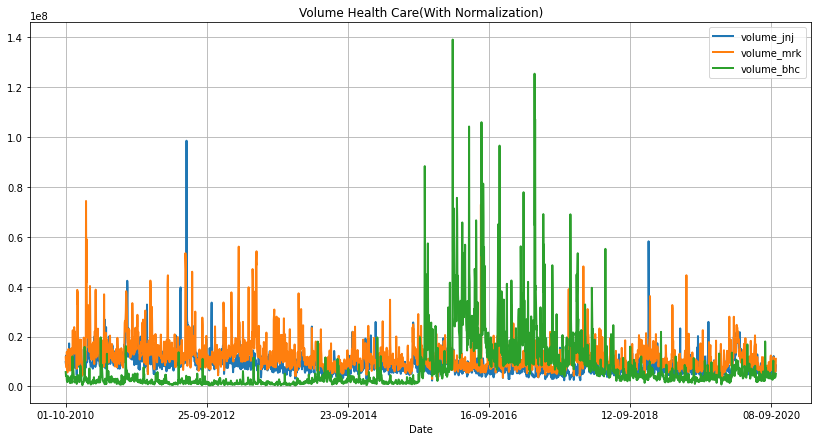

In [75]:
# Seperating the health care stocks in a new file:

only_healthv = only_volume.drop (columns = ['volume_aal','volume_alk','volume_goog','volume_ha','volume_cs','volume_db','volume_gs','volume_aapl','volume_snp','volume_amzn'])

# Plotting a line chart for all Health Care stocks after normalization: 

show_plot (only_healthv, 'Volume Health Care(With Normalization)')

**Observations:**

- In health care sector, Bausch Health Companies inc is the most traded stock followed by Johnson And Johnson, and Merk And Co.

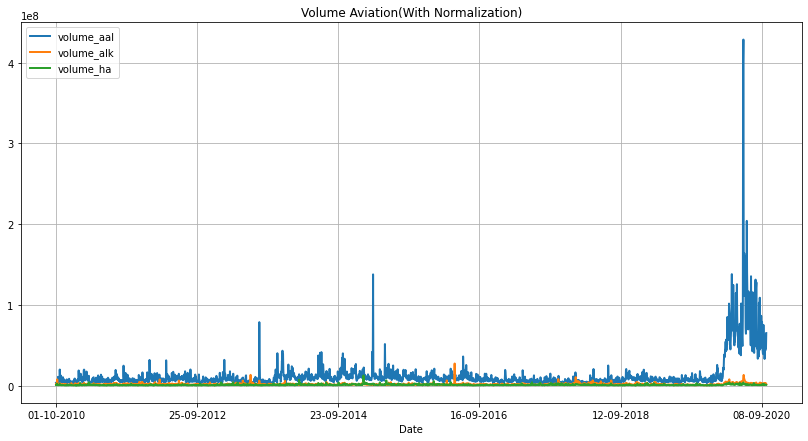

In [76]:
# Seperating the Aviation stocks in a new file:

only_aviationv = only_volume.drop (columns = ['volume_jnj','volume_mrk','volume_goog','volume_bhc','volume_cs','volume_db','volume_gs','volume_aapl','volume_snp','volume_amzn'])

# Plotting a line chart for all Aviation stocks after normalization: 

show_plot (only_aviationv, 'Volume Aviation(With Normalization)')

**Observations:**

- In aviation sector, American Airlines Group Inc is the most traded stock.

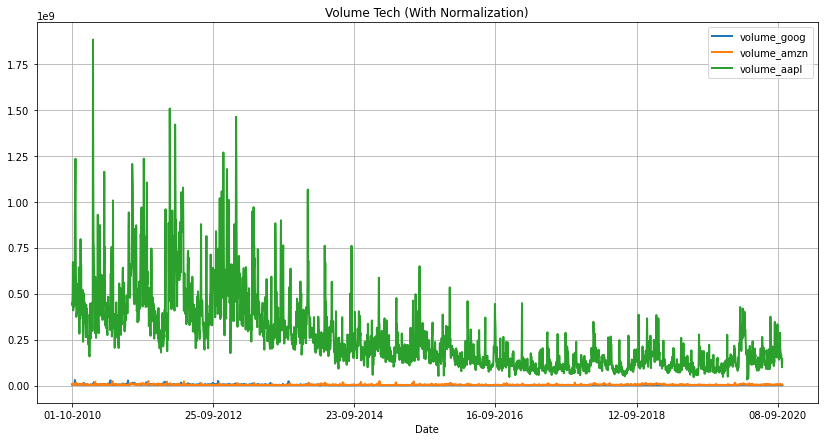

In [77]:
# Seperating the Tech stocks in a new file:

only_techv = only_volume.drop (columns = ['volume_jnj','volume_mrk','volume_aal','volume_bhc','volume_cs','volume_db','volume_gs','volume_alk','volume_snp','volume_ha'])

# Plotting a line chart for all Tech stocks after normalization: 

show_plot (only_techv, 'Volume Tech (With Normalization)')

**Observations:**

- In tech sector, Google is the most traded stock overall.

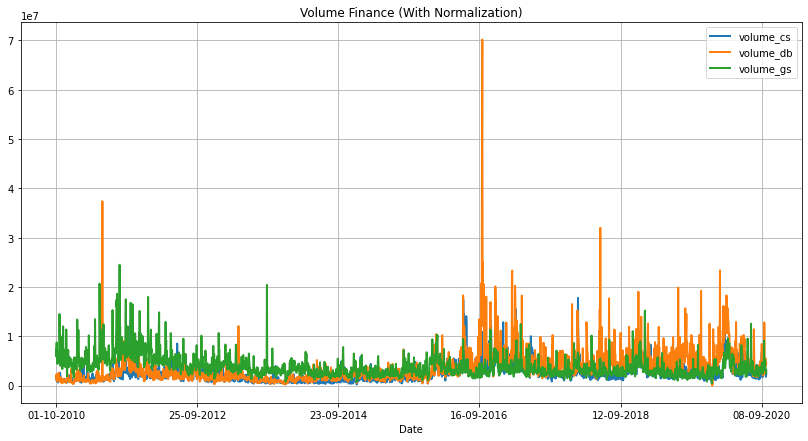

In [78]:
# Seperating the Finance stocks in a new file:

only_finance = only_volume.drop (columns = ['volume_jnj','volume_mrk','volume_goog','volume_bhc','volume_ha','volume_alk','volume_aal','volume_aapl','volume_snp','volume_amzn'])

# Plotting a line chart for all Health Care stocks after normalization: 

show_plot (only_finance, 'Volume Finance (With Normalization)')

**Observations:**
- In finance, Deutsche Bank is the most traded stock followed by Credit Suisse and Goldman Sachs.

**From volume graphs we may conclude that the most traded stcoks( stocks which people like to trade and invest in the most ) are:**
    - Deutsche Bank in Finance .
    - Google in Tech .
    - American Airlines Group Inc in Aviation .
    - Bausch Health Company in Health Care .

# Descriptive Summary of the Stock Prices:

In [79]:
# calculating risk , mean price , maximum price and minimum prices for stocks :

f1=f1.drop (columns = ['volume_aal','volume_alk','volume_goog','volume_ha','volume_cs','volume_db','volume_gs','volume_jnj','volume_mrk','volume_bhc','volume_aapl','volume_snp','volume_amzn'])
Summary  = f1.describe().transpose()
Summary  = Summary.drop(['count','25%','75%','count'], axis=1)
Summary.rename(columns={'std':'Risk','50%':'Median'}, inplace=True)
Summary['Risk'] = round(Summary['Risk'],0) 
Summary['min'] = round(Summary['min'],0) 
Summary['max'] = round(Summary['max'],0) 
Summary

,mean,Risk,min,Median,max
close_aal,29.397636,15.0,4.0,32.520000,58.0
close_alk,50.031176,24.0,12.0,58.540001,100.0
close_goog,730.426139,365.0,237.0,651.789978,1728.0
close_amzn,854.636107,745.0,153.0,533.750000,3531.0
close_ha,22.870413,15.0,4.0,21.910000,60.0
close_cs,21.501379,9.0,7.0,19.639999,47.0
close_db,27.304930,15.0,5.0,28.370001,63.0
close_gs,179.598184,42.0,88.0,177.229996,273.0
close_jnj,105.277378,28.0,58.0,104.040001,156.0
close_mrk,57.161053,15.0,30.0,57.180000,92.0


In [80]:

f2=f2.drop (columns = ['volume_aal','volume_alk','volume_goog','volume_ha','volume_cs','volume_db','volume_gs','volume_jnj','volume_mrk','volume_bhc','volume_aapl','volume_snp','volume_amzn'])
Summary  = f2.describe().transpose()
Summary  = Summary.drop(['count','25%','75%','count'], axis=1)
Summary.rename(columns={'std':'Risk','50%':'Median'}, inplace=True)

Summary['Risk'] = round(Summary['Risk'],0) 
Summary['min'] = round(Summary['min'],0) 
Summary['max'] = round(Summary['max'],0) 
Summary

,mean,Risk,min,Median,max
close_aal,3.164439,2.0,0.0,3.500538,6.0
close_alk,4.019375,2.0,1.0,4.702952,8.0
close_goog,2.789711,1.0,1.0,2.489376,7.0
close_amzn,5.560055,5.0,1.0,3.472448,23.0
close_ha,3.837318,3.0,1.0,3.676174,10.0
close_cs,0.509191,0.0,0.0,0.465110,1.0
close_db,0.519150,0.0,0.0,0.539401,1.0
close_gs,1.215966,0.0,1.0,1.199932,2.0
close_jnj,1.704897,0.0,1.0,1.684858,3.0
close_mrk,1.561777,0.0,1.0,1.562295,3.0


# Descriptive Summary of daily stock returns: 

In [81]:
# Summary including the cumulative returns, annualized returns, annualized risks:

Summary  = f1.describe().transpose()
Summary  = Summary.drop(['count','25%','75%','count','50%'], axis=1)
Summary.rename(columns={'std':'Risk','mean':'Avg_Daily_Returns'}, inplace=True)
Summary['Avg_Daily_Returns'] = round(Summary['Avg_Daily_Returns'],2) 
Summary['Risk'] = round(Summary['Risk'],0) 
Summary['min'] = round(Summary['min'],0) 
Summary['max'] = round(Summary['max'],0) 
Summary['Annualized_Returns'] = round(Summary['Avg_Daily_Returns']*252,2)
Summary['Annualized_Risk'] = round(Summary['Risk']*math.sqrt(252))
temp = f1.iloc[:, 1:]

Summary['Cumulative_Returns'] = round( (temp.iloc[-1] / temp.iloc[0] -1) *100,2).values

# del temp
Summary

,Avg_Daily_Returns,Risk,min,max,Annualized_Returns,Annualized_Risk,Cumulative_Returns
close_aal,29.40,15.0,4.0,58.0,7408.80,238.0,32.29
close_alk,50.03,24.0,12.0,100.0,12607.56,381.0,194.28
close_goog,730.43,365.0,237.0,1728.0,184068.36,5794.0,461.28
close_amzn,854.64,745.0,153.0,3531.0,215369.28,11827.0,1948.49
close_ha,22.87,15.0,4.0,60.0,5763.24,238.0,116.28
close_cs,21.50,9.0,7.0,47.0,5418.00,143.0,-76.39
close_db,27.30,15.0,5.0,63.0,6879.60,238.0,-84.03
close_gs,179.60,42.0,88.0,273.0,45259.20,667.0,36.07
close_jnj,105.28,28.0,58.0,156.0,26530.56,444.0,141.10
close_mrk,57.16,15.0,30.0,92.0,14404.32,238.0,126.64


# CONCLUSION :-

   This conclusion is based on Capital Asset Pricing Model ( CAPM ), descriptive summary, analysis on volume, analysis on close    price, line charts and volatility.

**Portfolio 1(Conservative)** :  We can consider a promising stock from each sectors. We can select `Google` (least risky among technology stocks) , `Alaska Airlines` from Aviation, `Johnson & Johnson` from Healthcare and `Goldman Sachs` from Finance. All these stocks have good Technicals and should have moderate growth in the upcoming years. Expected return from these stocks is `12.85%`.


**Portfolio 2(Risky and Aggressive)** : We can invest a major portion of money in Technology sector because this sector has always outperformed the S&P500 index and the return on investment in technology sector is very high. After that we can invest a minor portion in Aviation, HealthCare, and Finance. Stocks for this portfolio will be: `Amazon`, `Google`, `Apple`, `Alaska Airlines` ,`Johnson & Johnson` and `Goldman Sachs`. Expected Return will be `12.21%`.


**Conclusion** : Since the client is a student with simple and humble nature, portfolio 1 would be a better approach.After considering the fundamentals and technical parameters for this analysis it can be concluded that the client will have a decent return on her investment and she will be able to meet her financial goals.

# Forecast:

**We shall forecast and check how the suggested portfolio will behave in the upcoming years.**

In [82]:
# Checking the info of the dataset - to see null values, data type of dataset :

original.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2517 entries, 0 to 2516
Data columns (total 27 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Date         2517 non-null   object 
 1   close_aal    2517 non-null   float64
 2   volume_aal   2517 non-null   int64  
 3   close_alk    2517 non-null   float64
 4   volume_alk   2517 non-null   float64
 5   close_goog   2517 non-null   float64
 6   volume_goog  2517 non-null   float64
 7   close_amzn   2517 non-null   float64
 8   volume_amzn  2517 non-null   float64
 9   close_ha     2517 non-null   float64
 10  volume_ha    2517 non-null   float64
 11  close_cs     2517 non-null   float64
 12  volume_cs    2517 non-null   float64
 13  close_db     2517 non-null   float64
 14  volume_db    2517 non-null   float64
 15  close_gs     2517 non-null   float64
 16  volume_gs    2517 non-null   float64
 17  close_jnj    2517 non-null   float64
 18  volume_jnj   2517 non-null   float64
 19  close_

**No NAN values meaning that no missing values are there. There is no need for imputation. We can proceed with kpss-test.**

In [83]:
# We do not need date column so we can remove it and put the remaining columns under a new dataset "to_test" :

to_test = original.drop (columns = ['Date'])
to_test.head()

,close_aal,volume_aal,close_alk,volume_alk,close_goog,volume_goog,close_amzn,volume_amzn,close_ha,volume_ha,...,close_jnj,volume_jnj,close_mrk,volume_mrk,close_bhc,volume_bhc,close_aapl,volume_aapl,close_snp,volume_snp
0,9.29,3603800,12.4475,1663600.0,261.828613,4466600.0,153.710007,8683400.0,5.96,645400.0,...,61.750000,9773200.0,36.599998,11741900.0,25.750000,5778700.0,10.090000,448142800,1146.239990,4298910000
1,9.12,3856800,12.1425,1512400.0,260.199707,3895400.0,155.389999,5346500.0,5.75,618900.0,...,61.669998,8703600.0,36.520000,9234900.0,25.870001,4187200.0,9.951428,435302000,1137.030029,3604110000
2,9.23,3896600,12.2150,2567200.0,268.110046,7040400.0,160.869995,5620000.0,5.85,534800.0,...,62.799999,12439400.0,37.020000,10669200.0,26.299999,4610300.0,10.319285,501967200,1160.750000,4068840000
3,9.23,3230200,12.1875,1043600.0,266.177307,5545200.0,155.399994,6060800.0,5.97,2563900.0,...,63.209999,11339800.0,37.009998,7541300.0,26.690001,4448900.0,10.328215,670868800,1159.969971,4073160000
4,9.24,3877700,11.6250,7682400.0,264.015411,4809400.0,156.270004,4622000.0,6.15,1115200.0,...,63.220001,9826600.0,36.709999,13897800.0,26.600000,2453900.0,10.329286,408399600,1158.060059,3910550000


In [84]:
# Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test to check for stationarity of series :
# Creating a function for testing all the columns:

from statsmodels.tsa.stattools import kpss

for col in to_test.columns:
    kpss_test = kpss(to_test[col])
    
    print(col)
    print('KPSS Statistic: %f' % kpss_test[0])
    print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
    print('p-value: %f' % kpss_test[1])
    
    if kpss_test[1] >= 0.05:
        print("\nSeries is Stationary")
    else:
        print("\nSeries is Non-Stationary")
        
    print('\n--------------------------------------\n')

close_aal
KPSS Statistic: 3.889801
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Non-Stationary

--------------------------------------

volume_aal
KPSS Statistic: 1.379776
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Non-Stationary

--------------------------------------

close_alk
KPSS Statistic: 5.534522
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Non-Stationary

--------------------------------------

volume_alk
KPSS Statistic: 0.573942
Critical Values @ 0.05: 0.46
p-value: 0.025013

Series is Non-Stationary

--------------------------------------

close_goog
KPSS Statistic: 8.721507
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Non-Stationary

--------------------------------------

volume_goog
KPSS Statistic: 6.553971
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Non-Stationary

--------------------------------------

close_amzn
KPSS Statistic: 7.681389
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Non-Sta

**Observations:**

We can observe that all the series are Non-Stationary, hence we would need to convert them to Stationary for forecasting.


# Transforming Non-Stationary to Stationary:

**Here we will use Box-Cox transformation to convert the non-stationary series to stationary series.**

In [85]:
# Before transformation, we need to check that our dataset does not have any negative value, this can be done by checking 
# the minimum values for each columns:

print(to_test['close_amzn'].min())
print(to_test['close_aapl'].min())
print(to_test['close_goog'].min())
print(to_test['close_aal'].min())
print(to_test['close_alk'].min())
print(to_test['close_ha'].min())
print(to_test['close_cs'].min())
print(to_test['close_gs'].min())
print(to_test['close_db'].min())
print(to_test['close_snp'].min())
print(to_test['close_jnj'].min())
print(to_test['close_bhc'].min())
print(to_test['close_mrk'].min())

153.029999
9.951428
236.553345
4.0
11.62
3.78
6.67
87.699997
5.48
1099.22998
57.66
8.51
29.809998999999998


**There are no negative values for stock closing price. Means that they can be transformed using box-cox.**

In [86]:
# Checking for non-positive values in volume columns :

print(to_test['volume_amzn'].min())
print(to_test['volume_aapl'].min())
print(to_test['volume_goog'].min())
print(to_test['volume_aal'].min())
print(to_test['volume_alk'].min())
print(to_test['volume_ha'].min())
print(to_test['volume_cs'].min())
print(to_test['volume_gs'].min())
print(to_test['volume_db'].min())
print(to_test['volume_snp'].min())
print(to_test['volume_jnj'].min())
print(to_test['volume_bhc'].min())
print(to_test['volume_mrk'].min())

881300.0
32470000
7900.0
1158400
270600.0
120500.0
205000.0
467700.0
0.0
1025000000
2353800.0
380300.0
2235900.0


In [87]:
# Since the minimum volume value for Deutsche Bank is 0 and it is does not come under positive values,
# we need to either replace this value or delete it for boxcox:


to_test['volume_db'].sort_values(ascending=True)

2325           0.0
813       196900.0
561       249300.0
772       282900.0
757       321600.0
           ...    
1512    25104700.0
1928    31986000.0
164     37388500.0
1509    51994300.0
1510    70176200.0
Name: volume_db, Length: 2517, dtype: float64

In [88]:
# Since it's just one value, we can impute it with the previous day value of volume:

to_test['volume_db'][2324]

2242900.0

In [89]:
# Changing it to the previous day value :

to_test['volume_db'][2325] = 2242900
to_test['volume_db'][2325]

2242900.0

In [90]:
# Seeing the names of columns in dataset:

for col in to_test.columns:
    print(col)

close_aal
volume_aal
close_alk
volume_alk
close_goog
volume_goog
close_amzn
volume_amzn
close_ha
volume_ha
close_cs
volume_cs
close_db
volume_db
close_gs
volume_gs
close_jnj
volume_jnj
close_mrk
volume_mrk
close_bhc
volume_bhc
close_aapl
volume_aapl
close_snp
volume_snp


In [91]:
# Applying Boxcox :

for col in to_test.columns:
    col_boxcox = pd.Series(boxcox(to_test[col], lmbda=0), index = to_test.index)
    to_test[col+"_boxcox"] = col_boxcox

In [92]:
# Seeing the dataset after applying boxcox:

to_test.head()

,close_aal,volume_aal,close_alk,volume_alk,close_goog,volume_goog,close_amzn,volume_amzn,close_ha,volume_ha,...,close_jnj_boxcox,volume_jnj_boxcox,close_mrk_boxcox,volume_mrk_boxcox,close_bhc_boxcox,volume_bhc_boxcox,close_aapl_boxcox,volume_aapl_boxcox,close_snp_boxcox,volume_snp_boxcox
0,9.29,3603800,12.4475,1663600.0,261.828613,4466600.0,153.710007,8683400.0,5.96,645400.0,...,4.123094,16.095155,3.600048,16.278674,3.248435,15.569689,2.311545,19.920622,7.044242,22.181627
1,9.12,3856800,12.1425,1512400.0,260.199707,3895400.0,155.389999,5346500.0,5.75,618900.0,...,4.121798,15.979247,3.597860,16.038500,3.253084,15.247543,2.297716,19.891551,7.036175,22.005341
2,9.23,3896600,12.2150,2567200.0,268.110046,7040400.0,160.869995,5620000.0,5.85,534800.0,...,4.139955,16.336379,3.611458,16.182872,3.269569,15.343803,2.334014,20.034045,7.056822,22.126624
3,9.23,3230200,12.1875,1043600.0,266.177307,5545200.0,155.399994,6060800.0,5.97,2563900.0,...,4.146463,16.243829,3.611188,15.835905,3.284289,15.308167,2.334879,20.324084,7.056149,22.127685
4,9.24,3877700,11.6250,7682400.0,264.015411,4809400.0,156.270004,4622000.0,6.15,1115200.0,...,4.146621,16.100604,3.603049,16.447241,3.280911,14.713189,2.334983,19.827757,7.054502,22.086944


In [93]:
# We can keep only the columns created after boxcox and can drop all other columns in this data file:

to_test=to_test.drop(columns=['close_aal','volume_aal','close_aapl','volume_aapl','close_bhc','volume_bhc','close_gs',
                              'volume_gs','close_goog',
                              'volume_goog','close_amzn','volume_amzn','close_jnj','volume_jnj',
                              'close_mrk','volume_mrk','close_db',
                              'volume_db','close_cs','volume_cs','close_ha','volume_ha','close_alk',
                              'volume_alk','close_snp','volume_snp'])

In [94]:
# Differencing :

data_boxcox_diff = to_test.diff().dropna()

In [95]:
# Once again we need to perform Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test to check for stationarity:

for col in data_boxcox_diff.columns:
    kpss_test = kpss(data_boxcox_diff[col])
    
    print(col)
    print('KPSS Statistic: %f' % kpss_test[0])
    print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
    print('p-value: %f' % kpss_test[1])
    
    if kpss_test[1] >= 0.05:
        print("\nSeries is Stationary")
    else:
        print("\nSeries is Non-Stationary")
        
    print('\n--------------------------------------\n')

close_aal_boxcox
KPSS Statistic: 0.421271
Critical Values @ 0.05: 0.46
p-value: 0.067987

Series is Stationary

--------------------------------------

volume_aal_boxcox
KPSS Statistic: 0.035493
Critical Values @ 0.05: 0.46
p-value: 0.100000

Series is Stationary

--------------------------------------

close_alk_boxcox
KPSS Statistic: 0.452086
Critical Values @ 0.05: 0.46
p-value: 0.054704

Series is Stationary

--------------------------------------

volume_alk_boxcox
KPSS Statistic: 0.008898
Critical Values @ 0.05: 0.46
p-value: 0.100000

Series is Stationary

--------------------------------------

close_goog_boxcox
KPSS Statistic: 0.019576
Critical Values @ 0.05: 0.46
p-value: 0.100000

Series is Stationary

--------------------------------------

volume_goog_boxcox
KPSS Statistic: 0.009441
Critical Values @ 0.05: 0.46
p-value: 0.100000

Series is Stationary

--------------------------------------

close_amzn_boxcox
KPSS Statistic: 0.074201
Critical Values @ 0.05: 0.46
p-value: 0.

# Since the series is stationery now, we may forecast straight away now.

In [96]:
# Checking the columns left after dropping columns:

to_test.head()

,close_aal_boxcox,volume_aal_boxcox,close_alk_boxcox,volume_alk_boxcox,close_goog_boxcox,volume_goog_boxcox,close_amzn_boxcox,volume_amzn_boxcox,close_ha_boxcox,volume_ha_boxcox,...,close_jnj_boxcox,volume_jnj_boxcox,close_mrk_boxcox,volume_mrk_boxcox,close_bhc_boxcox,volume_bhc_boxcox,close_aapl_boxcox,volume_aapl_boxcox,close_snp_boxcox,volume_snp_boxcox
0,2.228939,15.097499,2.521520,14.324494,5.567690,15.312138,5.035068,15.976924,1.785070,13.377626,...,4.123094,16.095155,3.600048,16.278674,3.248435,15.569689,2.311545,19.920622,7.044242,22.181627
1,2.210470,15.165348,2.496712,14.229208,5.561449,15.175307,5.045938,15.491953,1.749200,13.335699,...,4.121798,15.979247,3.597860,16.038500,3.253084,15.247543,2.297716,19.891551,7.036175,22.005341
2,2.222459,15.175615,2.502665,14.758326,5.591398,15.767176,5.080597,15.541842,1.766442,13.189648,...,4.139955,16.336379,3.611458,16.182872,3.269569,15.343803,2.334014,20.034045,7.056822,22.126624
3,2.222459,14.988055,2.500411,13.858187,5.584163,15.528443,5.046002,15.617352,1.786747,14.757040,...,4.146463,16.243829,3.611188,15.835905,3.284289,15.308167,2.334879,20.324084,7.056149,22.127685
4,2.223542,15.170753,2.453158,15.854443,5.576007,15.386083,5.051585,15.346338,1.816452,13.924544,...,4.146621,16.100604,3.603049,16.447241,3.280911,14.713189,2.334983,19.827757,7.054502,22.086944


In [97]:
# Model Fitting :

model = VAR(to_test)
model_fit = model.fit()

# Making Predictions:

pred = model_fit.forecast(model_fit.y, steps = 1)
print(pred)

[[ 2.50628872 17.83063846  3.5976863  14.60566015  7.29223308 14.33456698
   8.05507017 15.30842184  2.55119642 13.72085107  2.29594783 14.83617412
   2.12388339 15.369282    5.30140802 14.95085045  5.00205967 15.82642181
   4.41694643 16.07141357  2.74378735 15.27295856  4.75293449 18.79597905
   8.11925449 22.24011289]]


In [98]:
# Keeping 70% values as train set :

train_len = int(to_test.shape[0]*0.7)
test_len = int(to_test.shape[0]) - int(to_test.shape[0]*0.7)

# Train data :
train_data = to_test[:train_len] 

# Test data :
test_data = to_test[train_len:]

In [99]:
# Fitting the VAR model to the data :

model = VAR(train_data)

In [100]:
# To select the lag order :

x = model.select_order(maxlags=50)
x.summary()

,AIC,BIC,FPE,HQIC
0,-82.73,-82.65,1.173e-36,-82.70
1,-142.3,-140.0*,1.654e-62*,-141.4*
2,-142.1,-137.7,1.988e-62,-140.5
3,-141.8,-135.3,2.604e-62,-139.4
4,-141.5,-132.8,3.417e-62,-138.3
5,-141.2,-130.4,4.658e-62,-137.2
6,-140.9,-127.9,6.497e-62,-136.1
7,-140.6,-125.4,9.233e-62,-135.0
8,-140.3,-123.0,1.258e-61,-133.9
9,-140.0,-120.5,1.678e-61,-132.8


In [101]:
# Providing maxlags as 26 (minimum AIC vaue) :
results = model.fit(maxlags = 26, ic = 'aic')

In [102]:
# Printing the results - Evaluation parameters, lag coefficients, etc. 

results.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 16, Aug, 2021
Time:                     11:32:41
--------------------------------------------------------------------
No. of Equations:         26.0000    BIC:                   -140.070
Nobs:                     1760.00    HQIC:                  -141.446
Log likelihood:           60954.0    FPE:                1.66095e-62
AIC:                     -142.253    Det(Omega_mle):     1.11801e-62
--------------------------------------------------------------------
Results for equation close_aal_boxcox
                           coefficient       std. error           t-stat            prob
----------------------------------------------------------------------------------------
const                        -0.334446         0.191979           -1.742           0.081
L1.close_aal_boxcox           0.992534         0.005181          191.573           0.000
L1.volume_aal_box

In [103]:
# Forecasting using the VAR model
# Selecting the lag value from the above results

lag_order = 26

In [104]:
# Obtaining the forecast values : 

predicted = results.forecast(train_data.values[-lag_order:], test_len)
forecast = pd.DataFrame(predicted, index = to_test.index[train_len:], columns = to_test.columns)

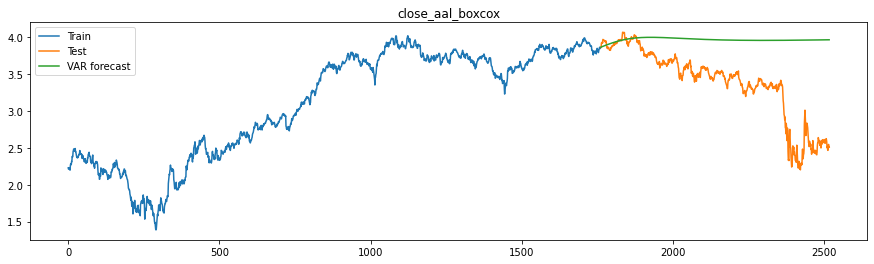

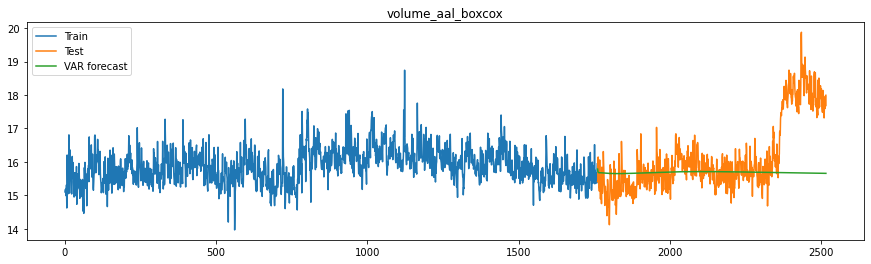

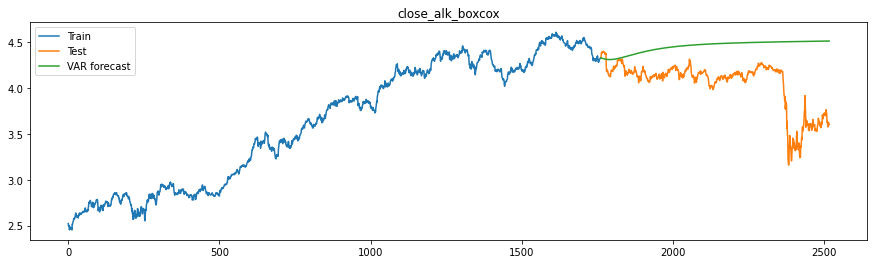

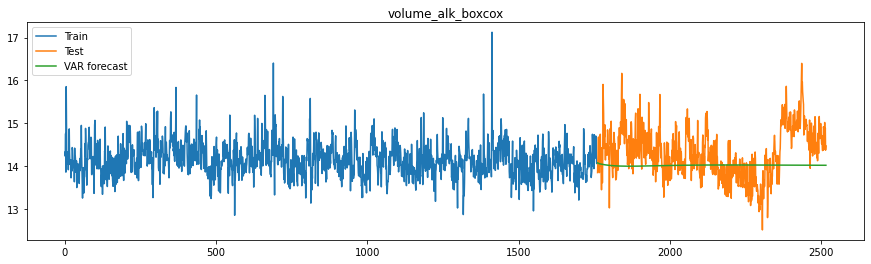

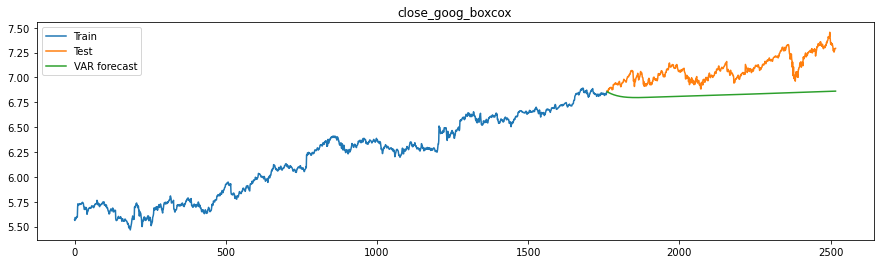

...

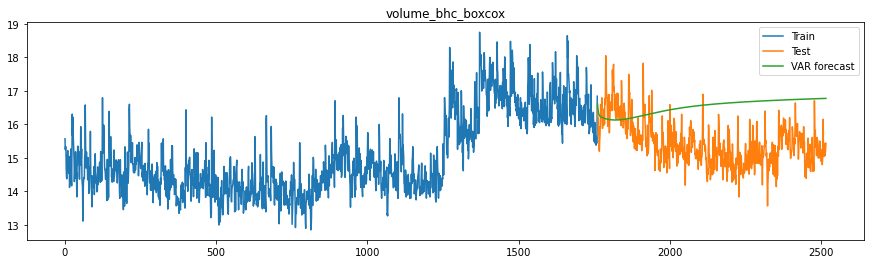

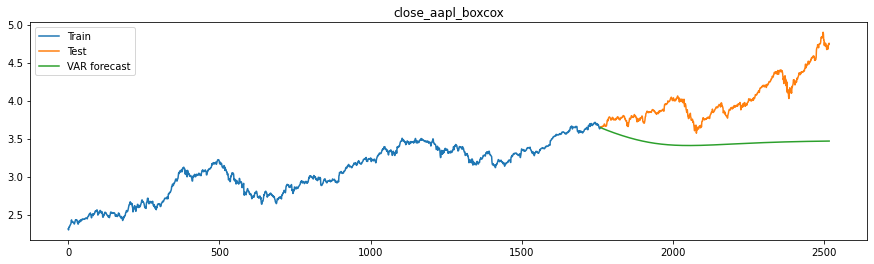

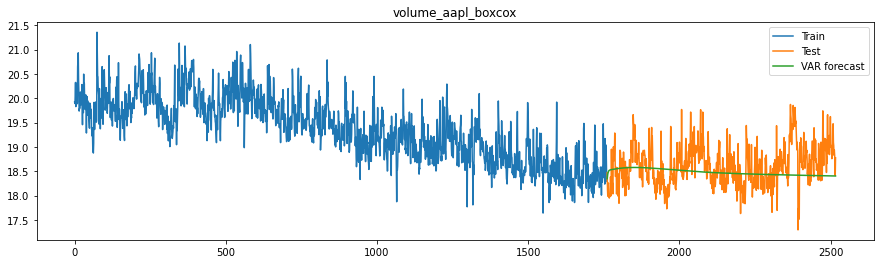

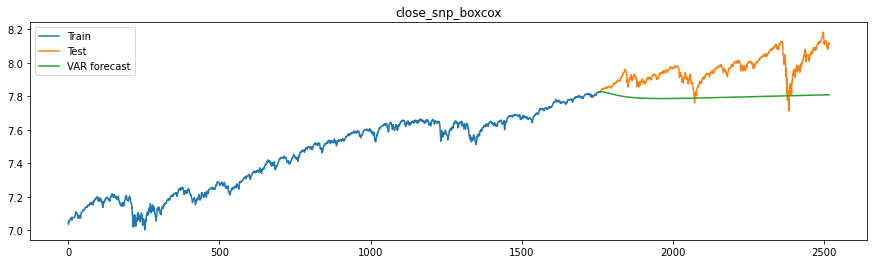

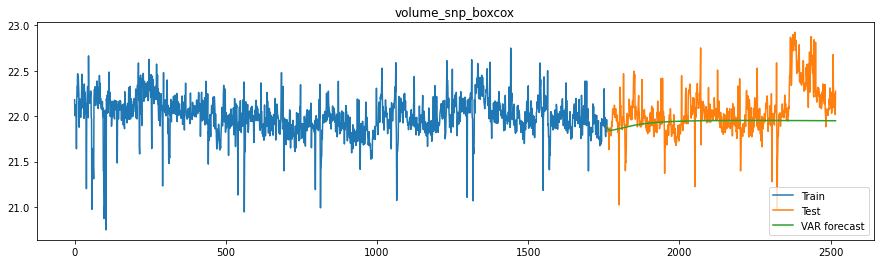

In [105]:
# Printing the train, test and forecasted values :

for col in to_test.columns:
    plt.figure(figsize=(15,4))
    plt.plot(to_test[col][:train_len], label='Train')
    plt.plot(to_test[col][train_len:], label='Test')
    plt.plot(forecast[col][:], label='VAR forecast')
    plt.legend(loc='best')
    plt.title(col)
    plt.show()

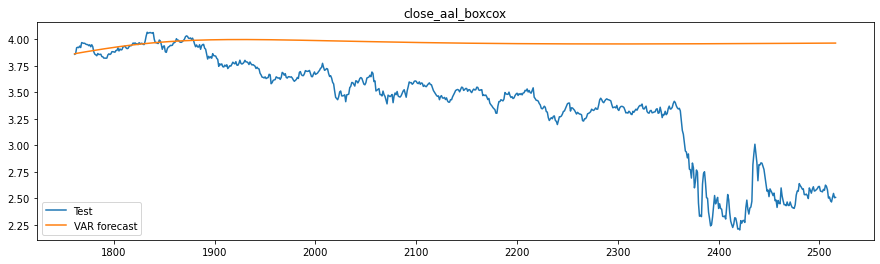

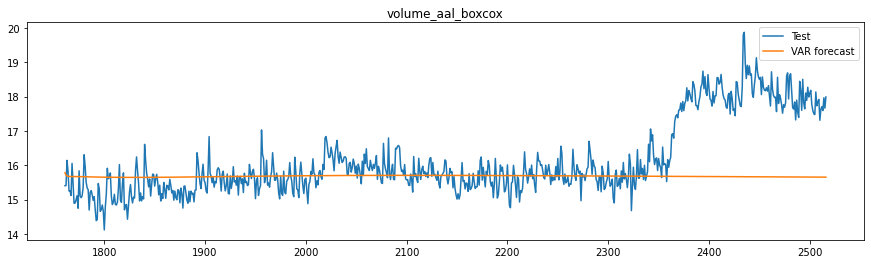

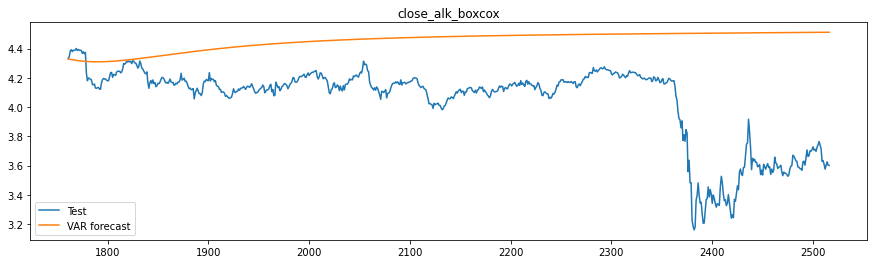

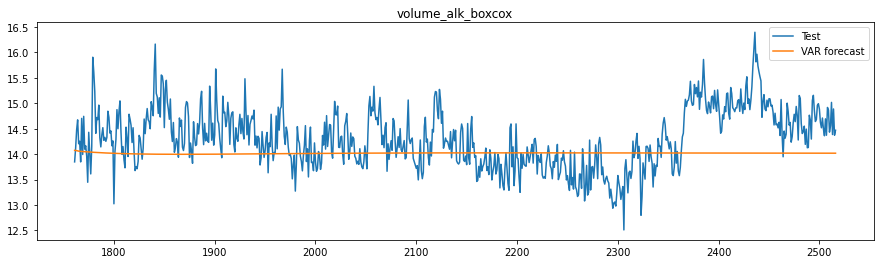

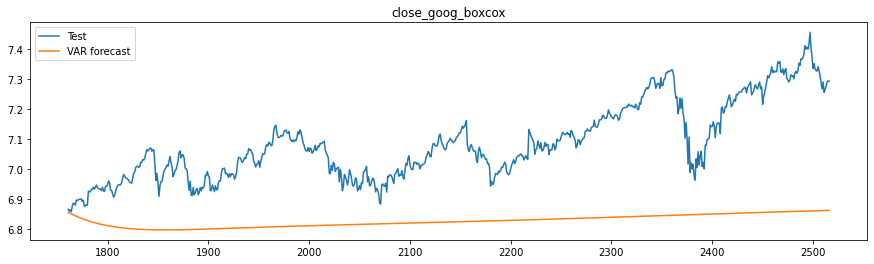

...

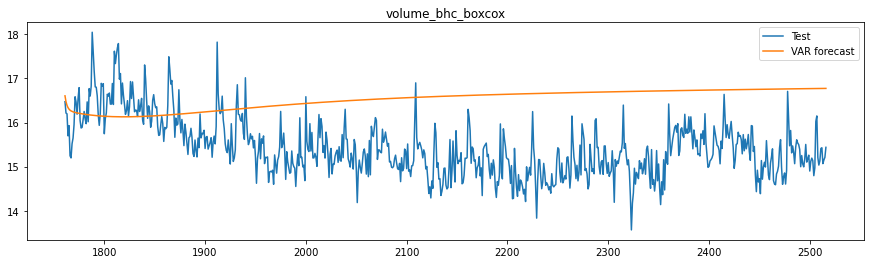

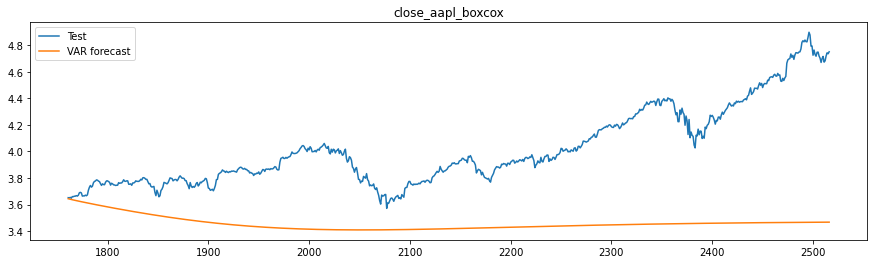

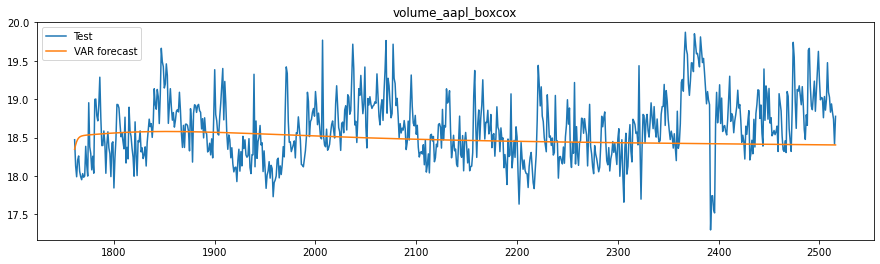

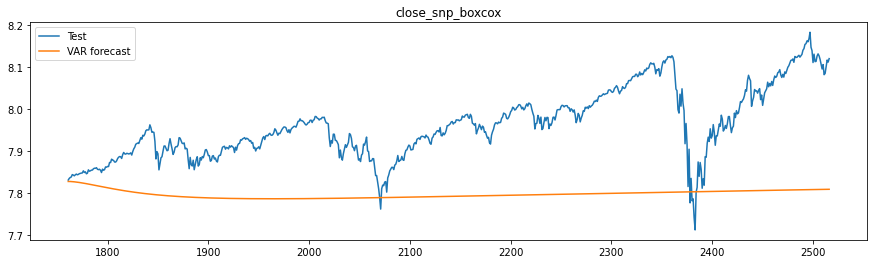

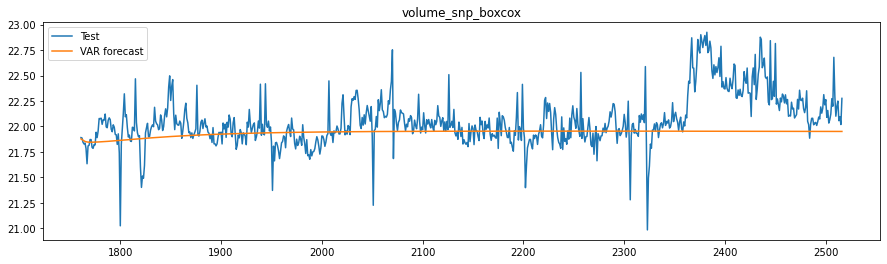

In [106]:
# Comparing the test and forecasted values :

for col in to_test.columns:
    plt.figure(figsize=(15,4))
    plt.plot(to_test[col][train_len:], label='Test')
    plt.plot(forecast[col][:], label='VAR forecast')
    plt.legend(loc='best')
    plt.title(col)
    plt.show()

**Observations :**
    
    There are some stocks which are outperforming the VAR Forecast, these are the highest returning stocks :
        - Google 
        - Amazon
        - Apple
        - Merk And Co.
        
    Stocks which look moderately in accordance to VAR Forecast: 
        - Goldman Sachs
        - Johnson And Johnson
        - Bausch Health Company
    
    Stocks which look bad after forecast :
        - Credit Suisse
        - Deutsche Bank
        - Hawaiian Airlines
        - American Airlines
        - Alaska Airlines 
        

In [107]:
# Model Evaluation

eval_results = pd.DataFrame(columns=['Column', 'RMSE', 'MAPE'])
tempResults = pd.DataFrame(columns=['Column', 'RMSE', 'MAPE'])

for col in to_test.columns:
    rmse = np.sqrt(mean_squared_error(test_data[col], forecast[col][:])).round(2)
    mape = np.round(np.mean(np.abs(test_data[col]-forecast[col][:])/test_data[col])*100,2)

    tempResults = pd.DataFrame({'Column':[col], 'RMSE': [rmse],'MAPE': [mape] })
    eval_results = pd.concat([eval_results, tempResults])
    
eval_results

,Column,RMSE,MAPE
0,close_aal_boxcox,0.75,20.12
0,volume_aal_boxcox,1.16,4.43
0,close_alk_boxcox,0.51,10.78
0,volume_alk_boxcox,0.65,3.54
0,close_goog_boxcox,0.28,3.63
0,volume_goog_boxcox,0.41,2.08
0,close_amzn_boxcox,0.70,8.63
0,volume_amzn_boxcox,0.57,2.88
0,close_ha_boxcox,0.75,19.92
0,volume_ha_boxcox,0.57,3.46


# CONCLUSION :

After Forecast and using the RMSE, MAPE values it can be said that the stocks belong to three major categories:
    - Stocks with highest returns.
    - Stocks with moderate returns.
    - Stocks with poor returns.

**According to this, the different type of portfolios can be:**
    
    - Portfolio 1 with highest returns ( most risky portfolio ):
        - Amazon
        - Google 
        - Apple
        - Merk And Co.
        
        
    - Portfolio 2 with good returns ( promising with not much risk ) :
        - Google
        - Goldman Sachs
        - Johnson And Johnson
        - Alaska Airlines
        
        
    - Portfolio 3 with low ( even negative ) returns :
        - Credit Suisse
        - Deutsche Bank
        - Hawaiian Airlines
        - American Airlines

**`Portfolio 2 is the ideal portfolio` with stocks:**
    
   **Google**
   
   **Goldman Sachs**
   
   **Johnson and Johnson**
   
   **Alaska Airlines**
   
Client can put equal amounts of money in all the above 4 mentioned stocks for moderate and diversified approach. Client can also give higher weightage to Google and lesser weightage to reamining three stocks for more returns as Google is good performing stock.
   
To increase returns and if the client is willing to take risks, remaining two technology stocks can be added to this portfolio:

*Google*

*Apple*

*Amazon*

*Goldman Sachs*

*Johnson and Johnson*

*Alaska Airlines*